In [1]:
import numpy as np
import os
import re
from time import time
from sklearn import tree
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import gensim
from gensim.models import Word2Vec, KeyedVectors
from gensim.models.fasttext import FastText
from gensim.test.utils import get_tmpfile
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import nltk
import seaborn as sea
from nltk.tokenize import word_tokenize 
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from wordcloud import WordCloud, STOPWORDS
from nltk.probability import FreqDist

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
os.chdir(os.getcwd())

In [2]:
"""nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download("stopwords")
nltk.download('wordnet')"""

'nltk.download(\'punkt\')\nnltk.download(\'averaged_perceptron_tagger\')\nnltk.download("stopwords")\nnltk.download(\'wordnet\')'

In [3]:
newsgroups_train = fetch_20newsgroups(subset='train')
target_names = list(newsgroups_train.target_names)
print(target_names)

['alt.atheism', 'comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x', 'misc.forsale', 'rec.autos', 'rec.motorcycles', 'rec.sport.baseball', 'rec.sport.hockey', 'sci.crypt', 'sci.electronics', 'sci.med', 'sci.space', 'soc.religion.christian', 'talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc', 'talk.religion.misc']


In [4]:
categories = []
for i in [1, 2, 5, 7, 11, 14, 18]:
    categories.append(target_names[i])
print(categories)

['comp.graphics', 'comp.os.ms-windows.misc', 'comp.windows.x', 'rec.autos', 'sci.crypt', 'sci.space', 'talk.politics.misc']


In [5]:
group_train = fetch_20newsgroups(subset='train', shuffle=True, random_state=42,
                                  categories=categories, 
                                  remove=('headers', 'footers', 'quotes'))
group_test = fetch_20newsgroups(subset='test', shuffle=True, random_state=42,
                                 categories=categories, 
                                 remove=('headers', 'footers', 'quotes'))

In [6]:
print(f"Количество текстов на обучение: {len(group_train.data)}")
print(f"Количество текстов на тест: {len(group_test.data)}")

Количество текстов на обучение: 4015
Количество текстов на тест: 2674


In [7]:
print('Метки классов для документов обучения:', group_train.target)
print('Метки классов для документов теста:', group_test.target)

Метки классов для документов обучения: [1 0 6 ... 5 3 3]
Метки классов для документов теста: [3 1 1 ... 3 1 4]


In [8]:
#Создаем датафрейм из обучающей выборки и тестовой
data_train = pd.DataFrame({'article': group_train.data, 'label': group_train.target})
data_test = pd.DataFrame({'article': group_test.data, 'label': group_test.target})
data_train.head()

,article,label
0,"\tThanks, I think I've figured it out now.\n\n...",1
1,\n:>re: majority of users not readding from fl...,0
2,"#1\n\nClayton, my man...\n\nYou are a tad out ...",6
3,This announcement is somewhat disconcerting; i...,4
4,: What has this got to do with comp.windows.x?...,2


In [9]:
data_test.head()

,article,label
0,What's the best lease quote that anyone has se...,3
1,Anyone know of a good software package that wi...,1
2,\n\n\nI have a copy. It isn't in there. Micr...,1
3,"\nWell, I got WINZIP from cica (don't know wh...",1
4,-> The current 4.9l V-8 will soldier on for ab...,3


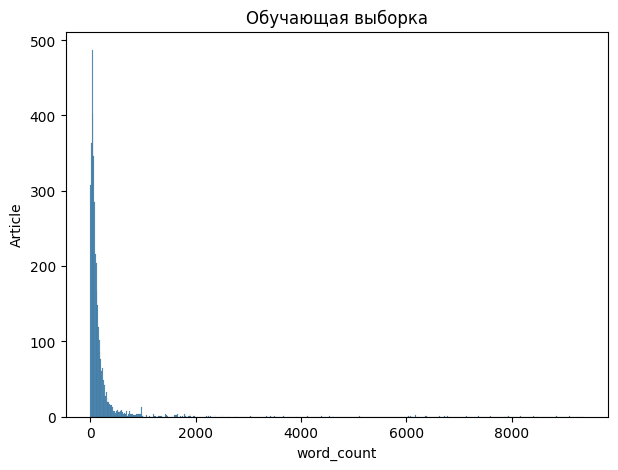

In [10]:
data_train['word_count'] = data_train['article'].apply(lambda x: len(str(x).split()))
plt.figure(figsize=(7,5))
sea.histplot(data=data_train, x='word_count')
plt.ylabel('Article')
plt.title('Обучающая выборка')
plt.show()

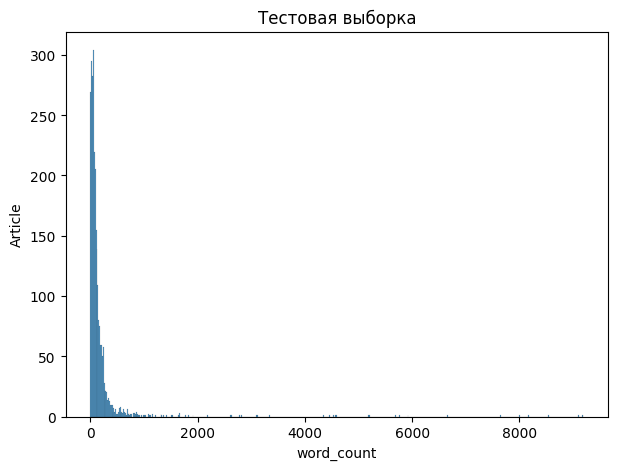

In [11]:
data_test['word_count'] = data_test['article'].apply(lambda x: len(str(x).split()))
plt.figure(figsize=(7,5))
sea.histplot(data=data_test, x='word_count')
plt.ylabel('Article')
plt.title('Тестовая выборка')
plt.show()

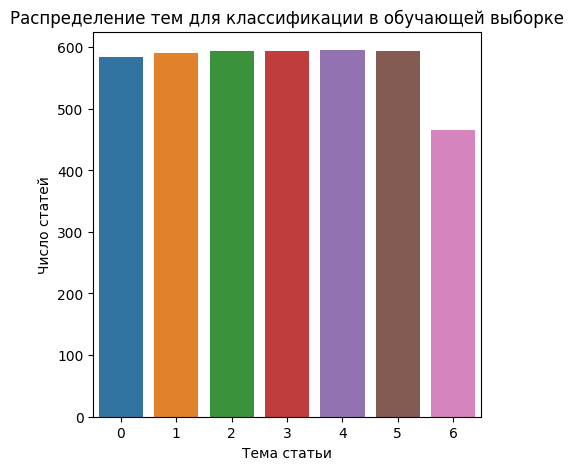

In [12]:
plt.figure(figsize=(5,5))
sea.countplot(data=data_train, x='label')
plt.title('Распределение тем для классификации в обучающей выборке')
plt.xlabel('Тема статьи')
plt.ylabel('Число статей')
plt.show()

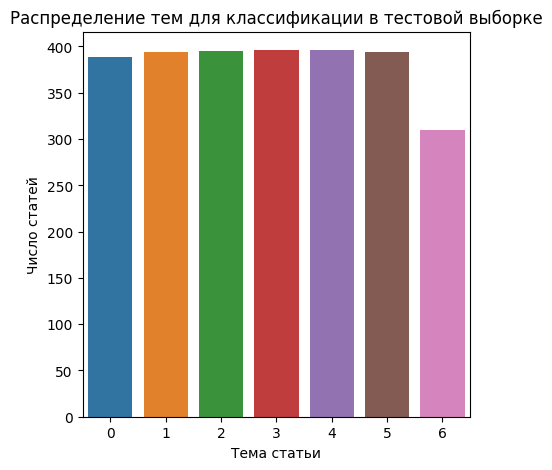

In [13]:
plt.figure(figsize=(5,5))
sea.countplot(data=data_test, x='label')
plt.title('Распределение тем для классификации в тестовой выборке')
plt.xlabel('Тема статьи')
plt.ylabel('Число статей')
plt.show()

In [14]:
train_precent = (sum(data_train['word_count'] < 350)/data_train.shape[0])*100
test_precent = (sum(data_test['word_count'] < 350)/data_test.shape[0])*100
print(f'Процент статей содержащих менее 350 слов в обучающей выборке: {train_precent}')
print(f'Процент статей содержащих менее 350 слов в тестовой выборке: {test_precent}')

Процент статей содержащих менее 350 слов в обучающей выборке: 91.2826899128269
Процент статей содержащих менее 350 слов в тестовой выборке: 92.74495138369484


In [15]:
#Процедура очистки тескта:
def wordnet_normal(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

def lemmatize(words):
    WNL = WordNetLemmatizer()
    word_pos = pos_tag(words)
    lem_list = []
    for tag in word_pos:
        lem_word = WNL.lemmatize(tag[0], wordnet_normal(tag[1]))
        lem_list.append(lem_word)
    return " ".join(lem_list)
        
def clearing(text):
    text_ = text
    text_ = str(text_).strip()   
    text_ = str(text_).lower()
    stop_words = open('stop_words_english.txt', 'r', encoding='utf8')
    stop_words = stop_words.read()
    stop_words = stop_words.split('\n')
    text_ = re.sub(r"\n", r" ", text_)
    tokens = list(word_tokenize(text_))
    """for x in stp:
        if x in tokens:
            tokens.remove(x)"""
    #new_tokens = [x for x in tokens if x not in list(stp)]
    new_txt = []
    for words in tokens:
        new_txt.append(''.join([char for char in words if (char.isalpha())]))
    txt_tokens = [word for word in new_txt if (len(word) > 2) and (word not in stop_words)]
    
    changed_text = lemmatize(txt_tokens)
    
    return changed_text


In [16]:
data_train['article'][1]

"\n:>re: majority of users not readding from floppy.\n:>Well, how about those of us who have 1400-picture CD-ROMS and would like to use\n:>CVIEW because it is fast and it works well, but can't because the moron lacked\n:>the foresight to create the temp file in the program's path, not the current\n:>didrectory?\n\n\n:  Actually the most flexible way to create temp files is to check for a TEMP or\n: TMP environment variable and create the files on the drive and directory pointedto by the variable.  This is pretty much a standard for DOS, Windows and OS/2\n: applications.\n\nUnfortunately, cview does not pay attention to the temp environment variable."

In [17]:
clearing(data_train['article'][1])
#Убедились, что очистка текста рбтает достаточно хорошо.

'majority user readding floppy picture cdroms cview fast works moron lack foresight create temp file program path current didrectory flexible create temp file check temp tmp environment variable create file drive directory pointedto variable pretty standard do window application cview pay attention temp environment variable'

In [18]:
#Применим её ко всем текстам 
data_train['article'] = data_train['article'].apply(clearing)
data_test['article'] = data_test['article'].apply(clearing)
train_docs = ' '.join(data_train['article'])
test_docs = ' '.join(data_test['article'])

"""tokenize_train_docs = word_tokenize(train_docs)
frensq_train = FreqDist(tokenize_train_docs)
common_train_words = []
for word in frensq_train.most_common():
    if word[1] <= 3:
        common_train_words.append(word[0])

tokenize_test_docs = word_tokenize(test_docs)
frensq_test = FreqDist(tokenize_test_docs)
common_test_words = []
for word in frensq_test.most_common():
    if word[1] <= 3:
        common_test_words.append(word[0])


def del_unusual(text, stop):
    stop = stop.copy()
    text = str(text).split()
    new_text = [x for x in text if x not in stop]
    new_text = ' '.join(new_text)
    return new_text

def del_unusual_test(text):
    for word in common_test_words:
        text = text.replace(word[0], '')
    return text

data_test['article'] = data_test['article'].apply(lambda x: del_unusual_test(x))

data_train['article'] = data_train['article'].apply(del_unusual, stop = common_train_words)
data_test['article'] = data_test['article'].apply(del_unusual, stop = common_test_words)

train_docs = ' '.join(data_train['article'])
test_docs = ' '.join(data_test['article'])
print(common_train_words)"""
print (data_train['article'][1])

majority user readding floppy picture cdroms cview fast works moron lack foresight create temp file program path current didrectory flexible create temp file check temp tmp environment variable create file drive directory pointedto variable pretty standard do window application cview pay attention temp environment variable


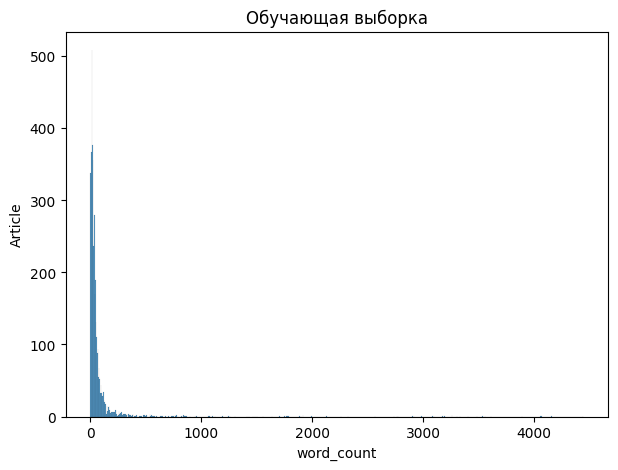

In [19]:
data_train['word_count'] = data_train['article'].apply(lambda x: len(str(x).split()))
plt.figure(figsize=(7,5))
sea.histplot(data=data_train, x='word_count')
plt.ylabel('Article')
plt.title('Обучающая выборка')
plt.show()

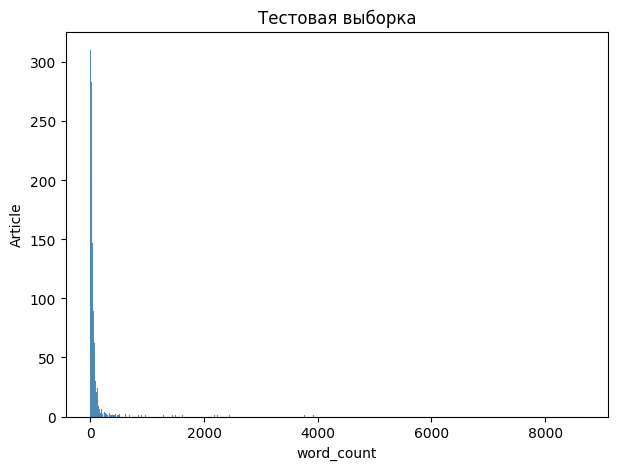

In [20]:
data_test['word_count'] = data_test['article'].apply(lambda x: len(str(x).split()))
plt.figure(figsize=(7,5))
sea.histplot(data=data_test, x='word_count')
plt.ylabel('Article')
plt.title('Тестовая выборка')
plt.show()

In [21]:
#Т.к. количество слов в статьях было значитально сокращено можно проверить, насколько можно урезать новостные статьи ещё раз
train_precent = (sum(data_train['word_count'] < 350)/data_train.shape[0])*100
test_precent = (sum(data_test['word_count'] < 350)/data_test.shape[0])*100
print(f'Процент статей содержащих менее 350 слов в обучающей выборке: {train_precent}')
print(f'Процент статей содержащих менее 350 слов в тестовой выборке: {test_precent}')

Процент статей содержащих менее 350 слов в обучающей выборке: 96.86176836861769
Процент статей содержащих менее 350 слов в тестовой выборке: 97.64397905759162


# Cоздаём  отдельно по каждому классу обучающей выборки документы для построения мешков слов

In [22]:
#'comp.graphics', 'comp.os.ms-windows.misc', 'comp.windows.x', 'rec.autos', 'sci.crypt', 'sci.space', 'talk.politics.misc'
#comp_graphics_train_docs = data_train.iloc[]
#print(comp_graphics_train_docs)
comp_graphics_train_docs = []
comp_graphics_train_docs.extend(data_train['article'][data_train['label']==0])
comp_os_ms_windows_misc_train_docs = [] 
comp_os_ms_windows_misc_train_docs.extend(data_train['article'][data_train['label']==1])
comp_windows_x_train_docs = []
comp_windows_x_train_docs.extend(data_train['article'][data_train['label']==2])
rec_autos_train_docs = []
rec_autos_train_docs.extend(data_train['article'][data_train['label']==3])
sci_crypt_train_docs = []
sci_crypt_train_docs.extend(data_train['article'][data_train['label']==4])
sci_space_train_docs = []
sci_space_train_docs.extend(data_train['article'][data_train['label']==5])
talk_politics_misc_train_docs =[]
talk_politics_misc_train_docs.extend(data_train['article'][data_train['label']==6])

In [23]:
"""comp_graphics_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_graphics_train_docs)
comp_os_ms_windows_misc_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_os_ms_windows_misc_train_docs)
comp_windows_x_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_windows_x_train_docs)
rec_autos_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(rec_autos_train_docs)
sci_crypt_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_crypt_train_docs)
sci_space_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_space_train_docs)
talk_politics_misc_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(talk_politics_misc_train_docs)

fig, ax = plt.subplots(2, 4, figsize=(25, 25))
ax[0, 0].imshow(comp_graphics_train_сloud)
ax[0, 0].axis('off')
ax[0, 1].imshow(comp_os_ms_windows_misc_train_сloud)
ax[0, 1].axis('off')
ax[0, 2].imshow(comp_windows_x_train_сloud)
ax[0, 2].axis('off')
ax[0, 3].imshow(rec_autos_train_сloud)
ax[0, 3].axis('off')
ax[1, 0].imshow(sci_crypt_train_сloud)
ax[1, 0].axis('off')
ax[1, 1].imshow(sci_space_train_сloud)
ax[1, 1].axis('off')
ax[1, 2].imshow(talk_politics_misc_train_сloud)
ax[1, 2].axis('off')
fig.delaxes(ax[1, 3])"""


'comp_graphics_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_graphics_train_docs)\ncomp_os_ms_windows_misc_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_os_ms_windows_misc_train_docs)\ncomp_windows_x_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_windows_x_train_docs)\nrec_autos_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(rec_autos_train_docs)\nsci_crypt_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_crypt_train_docs)\nsci_space_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_space_train_docs)\ntalk_politics_misc_train_сloud = WordCloud(max_words=300,colormap="Reds").generate(talk_politics_misc_train_docs)\n\nfig, ax = plt.subplots(2, 4, figsize=(25, 25))\nax[0, 0].imshow(comp_graphics_train_сloud)\nax[0, 0].axis(\'off\')\nax[0, 1].imshow(comp_os_ms_windows_misc_train_сloud)\nax[0, 1].axis(\'off\')\nax[0, 2].imshow(comp_windows_x_train_сloud)\nax[0, 2].axis(\

In [24]:
#BofW
c_vectorizer = CountVectorizer(min_df = 0.05, max_df = 0.95)
VecofW_comp_graphics_train_docs = c_vectorizer.fit_transform(comp_graphics_train_docs).toarray()
names = c_vectorizer.get_feature_names_out()
comp_graphics_train_df = pd.DataFrame(data = VecofW_comp_graphics_train_docs, columns = names).astype('float')
comp_graphics_train_df.apply(pd.to_numeric).style.background_gradient(axis = None, vmin = 0, cmap = 'RdYlGn')
comp_graphics_train_df

,address,advance,algorithm,animation,application,appreciate,article,base,bit,book,...,surface,time,type,version,vga,video,window,work,write,year
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,2.0,0.0,0.0,0.0,2.0,2.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
579,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
580,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
581,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
582,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Cоздаём  отдельно по каждому классу тестовой выборки документы для построения мешков слов

In [25]:
"""comp_graphics_test_docs = ''.join(data_test['article'][data_test['label']==0])
comp_os_ms_windows_misc_test_docs = ''.join(data_test['article'][data_test['label']==1])
comp_windows_x_test_docs = ''.join(data_test['article'][data_test['label']==2])
rec_autos_test_docs = ''.join(data_test['article'][data_test['label']==3])
sci_crypt_test_docs = ''.join(data_test['article'][data_test['label']==4])
sci_space_test_docs = ''.join(data_test['article'][data_test['label']==5])
talk_politics_misc_test_docs = ''.join(data_test['article'][data_test['label']==6])"""

"comp_graphics_test_docs = ''.join(data_test['article'][data_test['label']==0])\ncomp_os_ms_windows_misc_test_docs = ''.join(data_test['article'][data_test['label']==1])\ncomp_windows_x_test_docs = ''.join(data_test['article'][data_test['label']==2])\nrec_autos_test_docs = ''.join(data_test['article'][data_test['label']==3])\nsci_crypt_test_docs = ''.join(data_test['article'][data_test['label']==4])\nsci_space_test_docs = ''.join(data_test['article'][data_test['label']==5])\ntalk_politics_misc_test_docs = ''.join(data_test['article'][data_test['label']==6])"

In [26]:
"""comp_graphics_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_graphics_test_docs)
comp_os_ms_windows_misc_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_os_ms_windows_misc_test_docs)
comp_windows_x_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_windows_x_test_docs)
rec_autos_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(rec_autos_test_docs)
sci_crypt_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_crypt_test_docs)
sci_space_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_space_test_docs)
talk_politics_misc_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(talk_politics_misc_test_docs)

fig, ax = plt.subplots(2, 4, figsize=(25, 25))
ax[0, 0].imshow(comp_graphics_test_сloud)
ax[0, 0].axis('off')
ax[0, 1].imshow(comp_os_ms_windows_misc_test_сloud)
ax[0, 1].axis('off')
ax[0, 2].imshow(comp_windows_x_test_сloud)
ax[0, 2].axis('off')
ax[0, 3].imshow(rec_autos_test_сloud)
ax[0, 3].axis('off')
ax[1, 0].imshow(sci_crypt_test_сloud)
ax[1, 0].axis('off')
ax[1, 1].imshow(sci_space_test_сloud)
ax[1, 1].axis('off')
ax[1, 2].imshow(talk_politics_misc_test_сloud)
ax[1, 2].axis('off')
fig.delaxes(ax[1, 3])"""

'comp_graphics_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_graphics_test_docs)\ncomp_os_ms_windows_misc_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_os_ms_windows_misc_test_docs)\ncomp_windows_x_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(comp_windows_x_test_docs)\nrec_autos_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(rec_autos_test_docs)\nsci_crypt_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_crypt_test_docs)\nsci_space_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(sci_space_test_docs)\ntalk_politics_misc_test_сloud = WordCloud(max_words=300,colormap="Reds").generate(talk_politics_misc_test_docs)\n\nfig, ax = plt.subplots(2, 4, figsize=(25, 25))\nax[0, 0].imshow(comp_graphics_test_сloud)\nax[0, 0].axis(\'off\')\nax[0, 1].imshow(comp_os_ms_windows_misc_test_сloud)\nax[0, 1].axis(\'off\')\nax[0, 2].imshow(comp_windows_x_test_сloud)\nax[0, 2].axis(\'off\')\nax[0, 3]

# Создаём облако слов для обучающей выборки

(-0.5, 399.5, 199.5, -0.5)

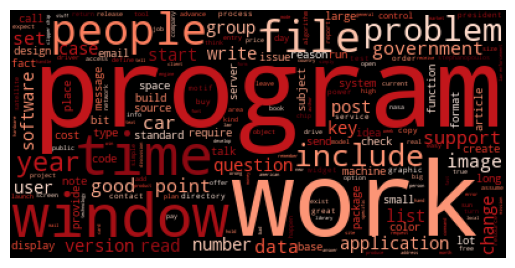

In [27]:
#Облако слов обучающей выборки
train_cloud = WordCloud(max_words=300,colormap="Reds").generate(train_docs)
plt.imshow(train_cloud)
plt.axis('off')

# Создаём облако слов для тестовой выборки

(-0.5, 399.5, 199.5, -0.5)

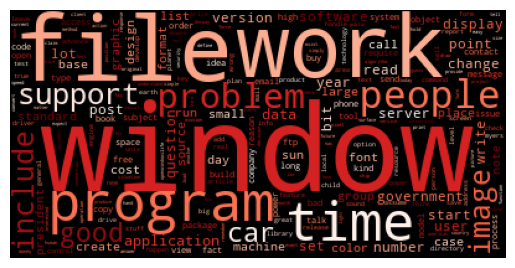

In [28]:
#Облако слов тестовой выборки
test_cloud = WordCloud(max_words=300,colormap="Reds").generate(test_docs)
plt.imshow(test_cloud)
plt.axis('off')

In [29]:
#Часто встречающиеся слова в обучающей выборке
tokenize_train_docs = word_tokenize(train_docs)
frensq_train = FreqDist(tokenize_train_docs)
common_train_words = []
common_train_words.extend(frensq_train.most_common(54))
frensq_train.most_common(54)

[('file', 1963),
 ('program', 1643),
 ('work', 1312),
 ('people', 1259),
 ('time', 1240),
 ('window', 1167),
 ('space', 1021),
 ('problem', 999),
 ('include', 938),
 ('key', 937),
 ('image', 927),
 ('year', 896),
 ('data', 829),
 ('number', 802),
 ('good', 774),
 ('government', 771),
 ('set', 745),
 ('post', 741),
 ('car', 737),
 ('version', 732),
 ('bit', 707),
 ('support', 690),
 ('question', 651),
 ('email', 634),
 ('list', 612),
 ('point', 611),
 ('group', 609),
 ('write', 609),
 ('user', 596),
 ('chip', 593),
 ('application', 590),
 ('read', 583),
 ('server', 577),
 ('software', 576),
 ('encryption', 545),
 ('source', 537),
 ('send', 533),
 ('code', 530),
 ('call', 526),
 ('entry', 520),
 ('display', 517),
 ('president', 515),
 ('change', 513),
 ('start', 495),
 ('case', 492),
 ('mail', 489),
 ('package', 485),
 ('message', 477),
 ('widget', 471),
 ('law', 460),
 ('bhj', 459),
 ('public', 457),
 ('build', 457),
 ('run', 446)]

In [30]:
tokenize_test_docs = word_tokenize(test_docs)
frensq_test = FreqDist(tokenize_test_docs)
common_test_words = []
common_test_words = frensq_test.most_common(18) 
common_test_words.extend(word for word in frensq_test.most_common() if word[1] <= 1)
frensq_test.most_common(18)

[('file', 1247),
 ('image', 1132),
 ('program', 838),
 ('people', 763),
 ('work', 749),
 ('window', 748),
 ('time', 734),
 ('problem', 607),
 ('version', 550),
 ('support', 539),
 ('include', 526),
 ('good', 507),
 ('bit', 506),
 ('data', 501),
 ('car', 477),
 ('software', 470),
 ('jpeg', 467),
 ('format', 460)]

# Создаём отредактированное облако слов для обучающей выборки

(-0.5, 399.5, 199.5, -0.5)

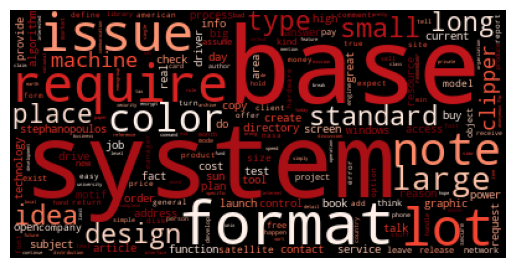

In [31]:
#Расширим список стоп-слов
temporaly_train_stop = []
temporaly_train_stop.extend(x[0] for x in common_train_words)
train_docs = ''.join(data_train['article'])
train_cloud = WordCloud(stopwords=set(temporaly_train_stop),colormap="Reds").generate(train_docs)
plt.imshow(train_cloud)
plt.axis('off')

# Создаём отредактированное облако слов для тестовой выборки

(-0.5, 399.5, 199.5, -0.5)

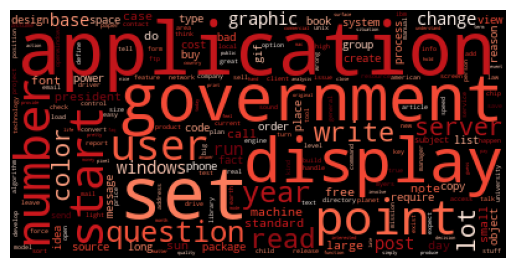

In [32]:
temporaly_test_stop = []
temporaly_test_stop.extend(x[0] for x in common_test_words)
test_docs = ''.join(data_test['article'])
test_cloud = WordCloud(stopwords=set(temporaly_test_stop),colormap="Reds").generate(test_docs)

plt.imshow(test_cloud)
plt.axis('off')

In [33]:
tfidf = TfidfVectorizer(min_df = 0.01, max_df = 0.99)
train_data_tfidf = []
train_data_tfidf.extend(data_train['article'])
table_train_tf = tfidf.fit_transform(train_data_tfidf).toarray()
principal = PCA(n_components = 3)
scaling=StandardScaler()
scaling.fit(table_train_tf)
Scaled_train_data=scaling.transform(table_train_tf)
principal.fit(Scaled_train_data)
x=principal.transform(Scaled_train_data)
print(x.shape, Scaled_train_data)

(4015, 3) [[-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 ...
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]]


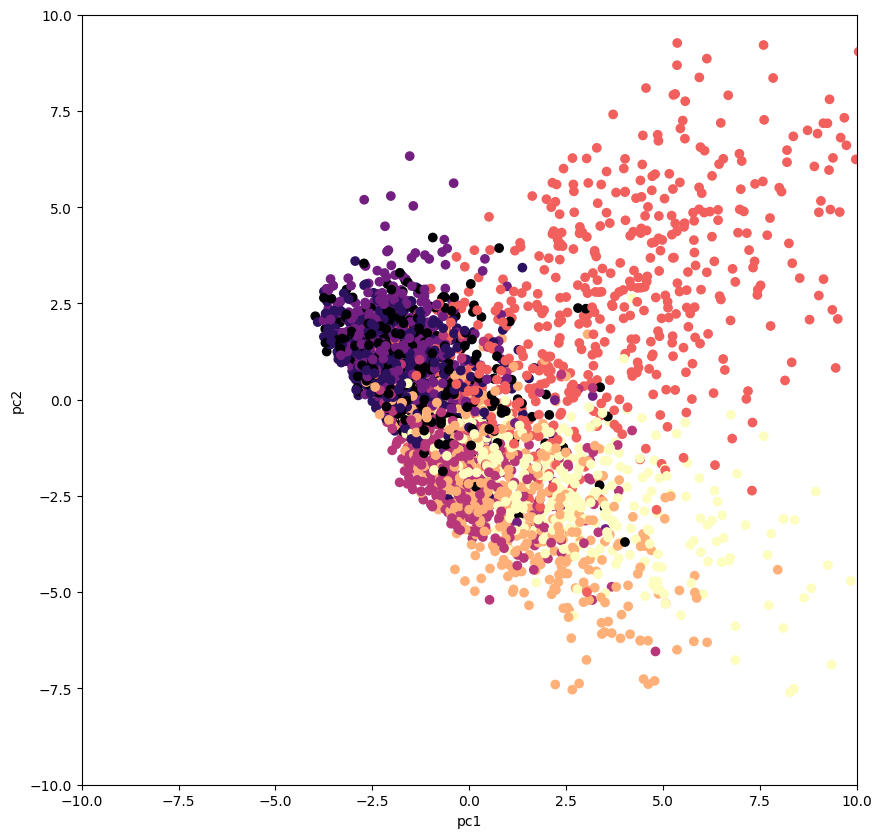

In [34]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_train['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

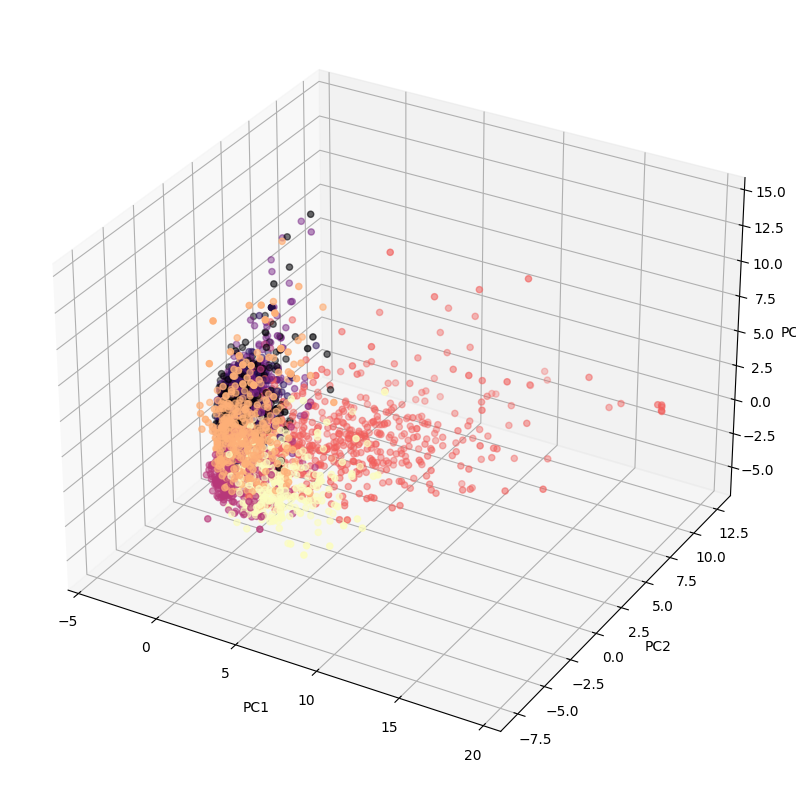

In [35]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_train['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

In [36]:
test_data_tfidf = []
test_data_tfidf.extend(data_test['article'])
table_test_tf = tfidf.fit_transform(test_data_tfidf).toarray()
principal = PCA(n_components = 3)
scaling=StandardScaler()
scaling.fit(table_test_tf)
Scaled_test_data=scaling.transform(table_test_tf)
principal.fit(Scaled_test_data)
x=principal.transform(Scaled_test_data)
print(x.shape, Scaled_test_data)

(2674, 3) [[-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 ...
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217  1.96653832
   7.66022654]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]]


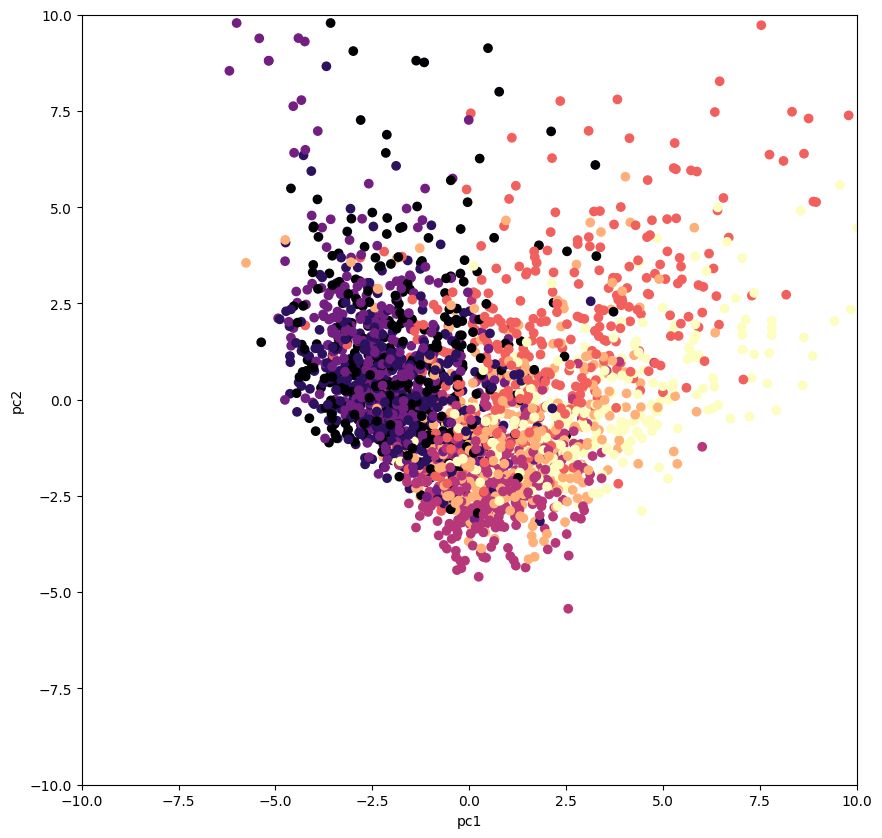

In [37]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_test['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

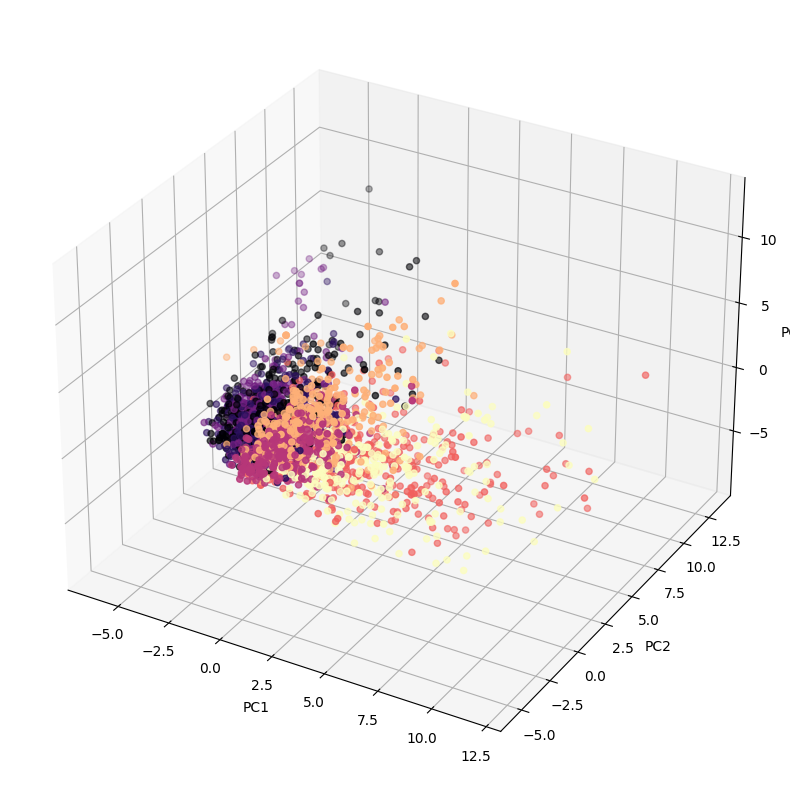

In [38]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_test['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# Пробуем TSNE
# 1) Train data

In [39]:
tsne = TSNE(n_components=3)
scaling.fit(table_train_tf)
Scaled_train_data=scaling.transform(table_train_tf)
tsne.fit(Scaled_train_data)
x=tsne.fit_transform(Scaled_train_data)
print(x.shape, Scaled_train_data)

(4015, 3) [[-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 ...
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]
 [-0.08694928 -0.09440929 -0.16393416 ... -0.09586141 -0.26813861
  -0.07729073]]


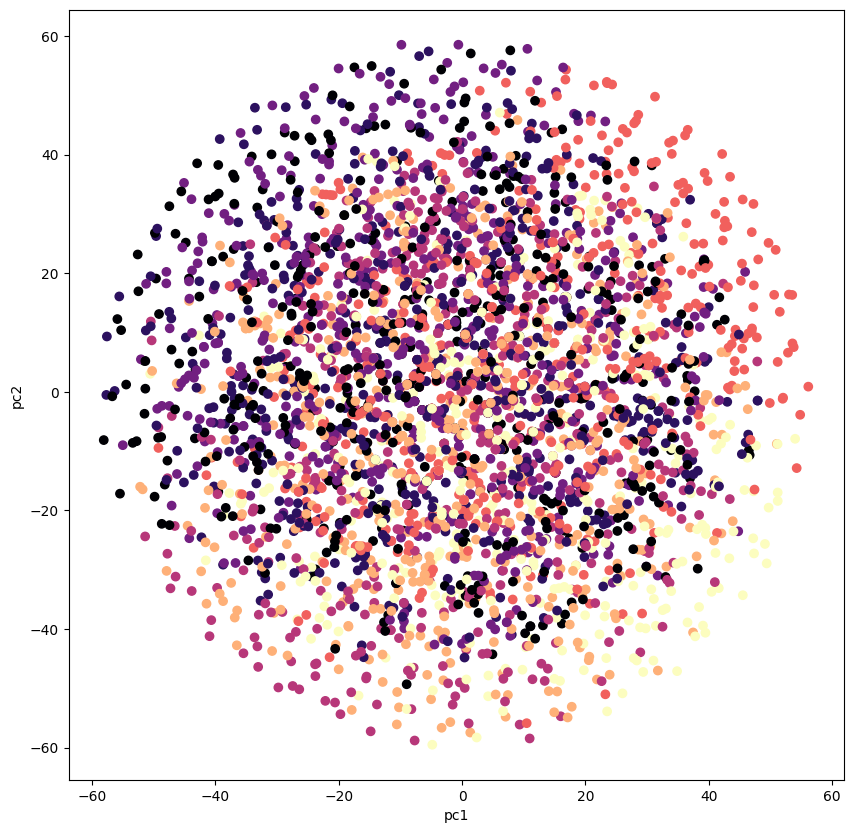

In [40]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_train['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
#plt.xlim([-10, 10])
#plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

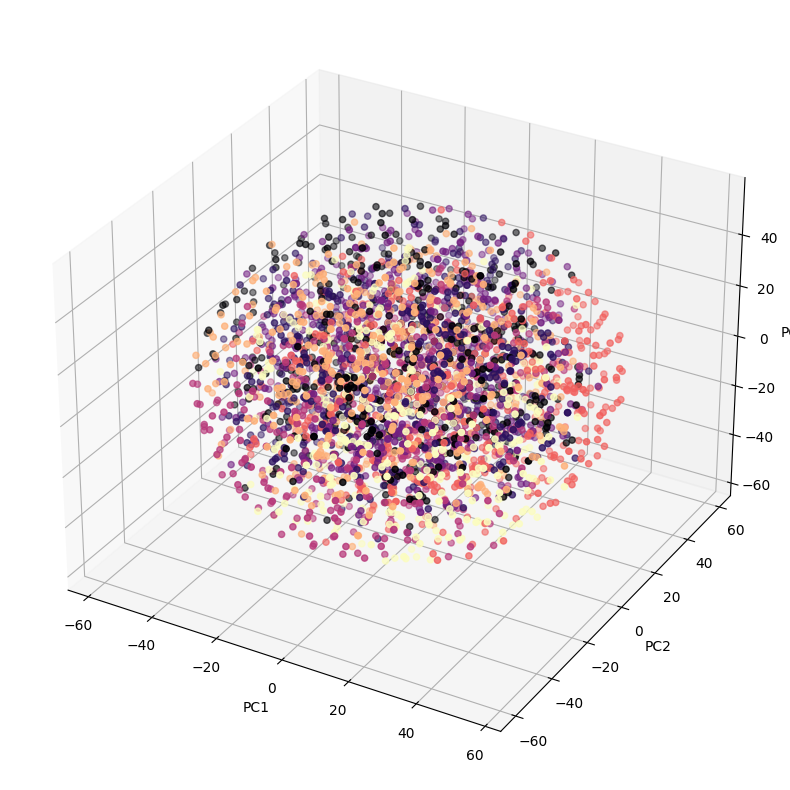

In [41]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_train['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# Test data

In [42]:
tsne = TSNE(n_components=3)
scaling.fit(table_test_tf)
Scaled_test_data=scaling.transform(table_test_tf)
tsne.fit(Scaled_test_data)
x=tsne.fit_transform(Scaled_test_data)
print(x.shape, Scaled_test_data)

(2674, 3) [[-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 ...
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217  1.96653832
   7.66022654]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]
 [-0.11348374 -0.087847   -0.08106652 ... -0.08911217 -0.23476359
  -0.08741182]]


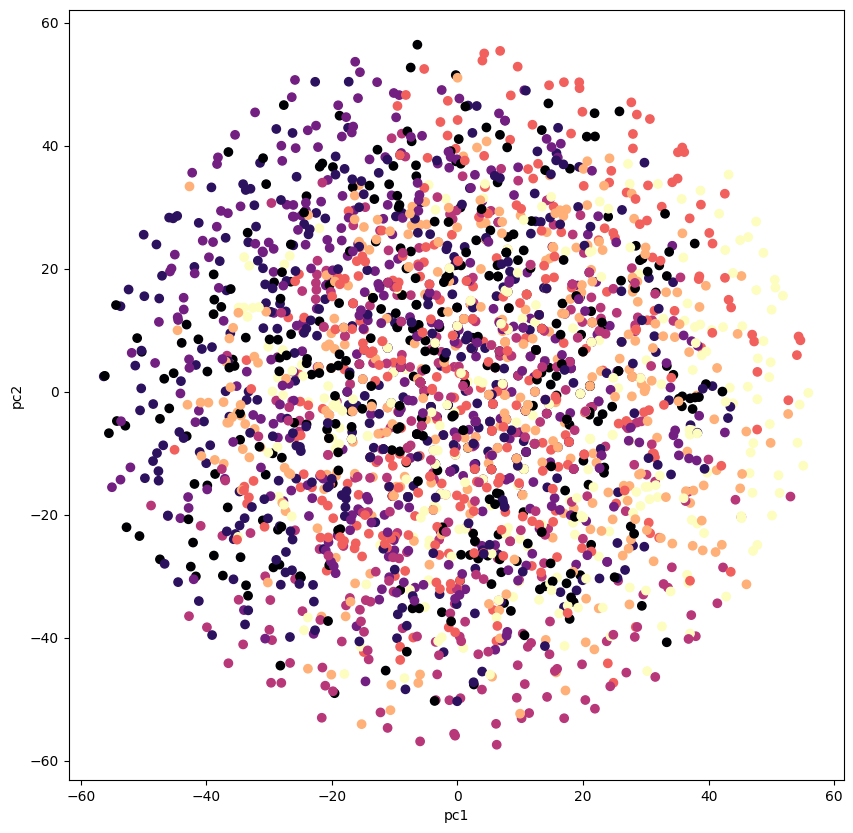

In [43]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_test['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
#plt.xlim([-10, 10])
#plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

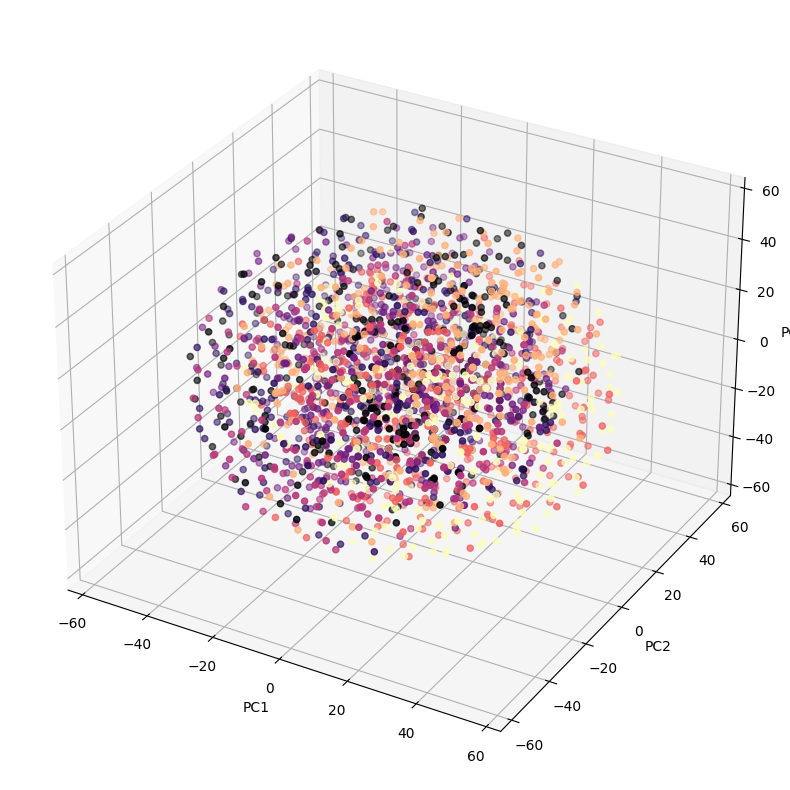

In [44]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_test['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# Логистическая регрессия для необработанных текстов

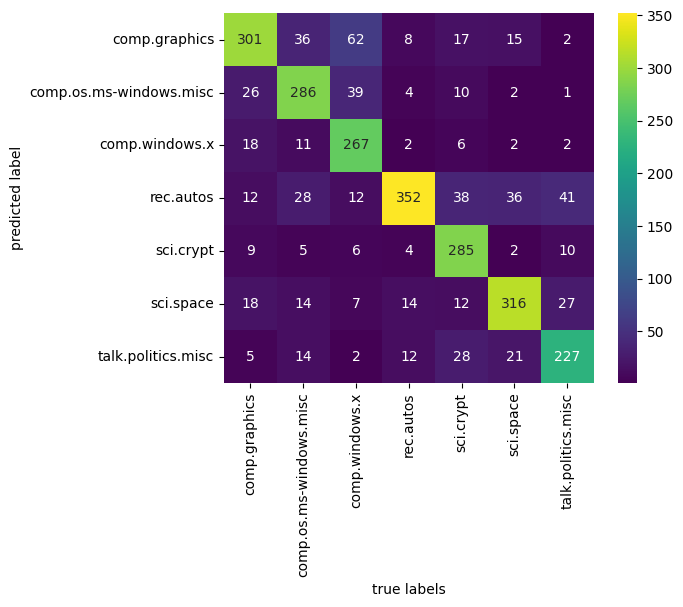

The accuracy is 0.7606581899775617


In [45]:
model = make_pipeline(TfidfVectorizer(), LogisticRegression( random_state=64, solver='lbfgs', max_iter=10000, n_jobs=-1))

model.fit(group_train.data, group_train.target)
predicted_categories = model.predict(group_test.data)

mat = confusion_matrix(group_test.target, predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='viridis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(group_test.target, predicted_categories)))


# Логистическая регрессия для обработанных текстов

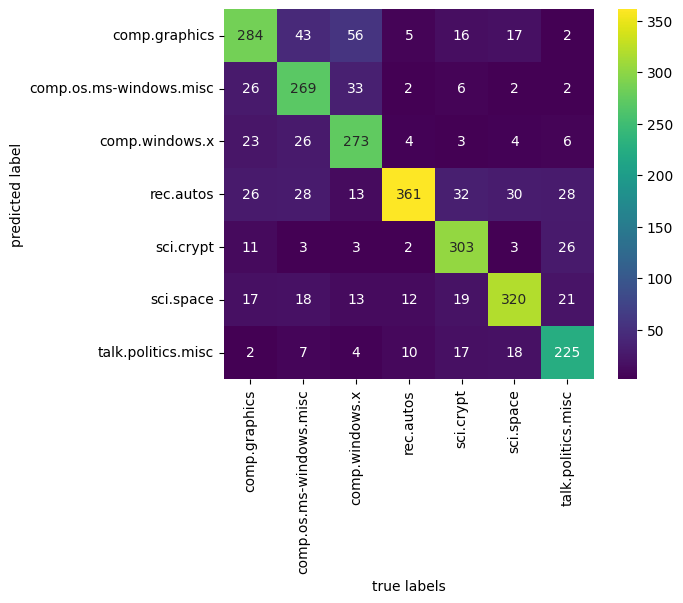

The accuracy is 0.7610321615557217


In [46]:
model = make_pipeline(TfidfVectorizer(), LogisticRegression( random_state=64, solver='lbfgs', max_iter=10000, n_jobs=-1))

model.fit(data_train['article'], data_train['label'])
predicted_categories = model.predict(data_test['article'])

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='viridis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Здесь представлена работа мультиноминального байесовского матода для необработанных текстов

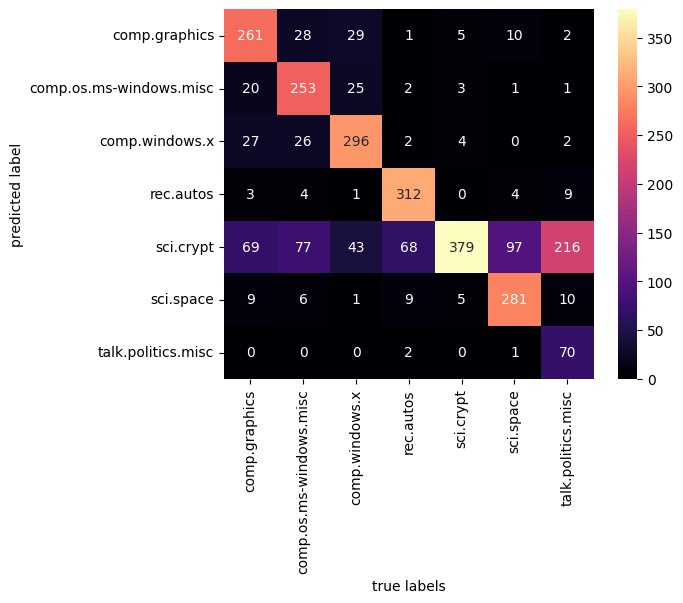

The accuracy is 0.6925953627524308


In [47]:
model = make_pipeline(TfidfVectorizer(), MultinomialNB())

model.fit(group_train.data, group_train.target)
predicted_categories = model.predict(group_test.data)

mat = confusion_matrix(group_test.target, predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='magma', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(group_test.target, predicted_categories)))


# Здесь представлена работа мультиноминального байесовского матода для обработанных текстов

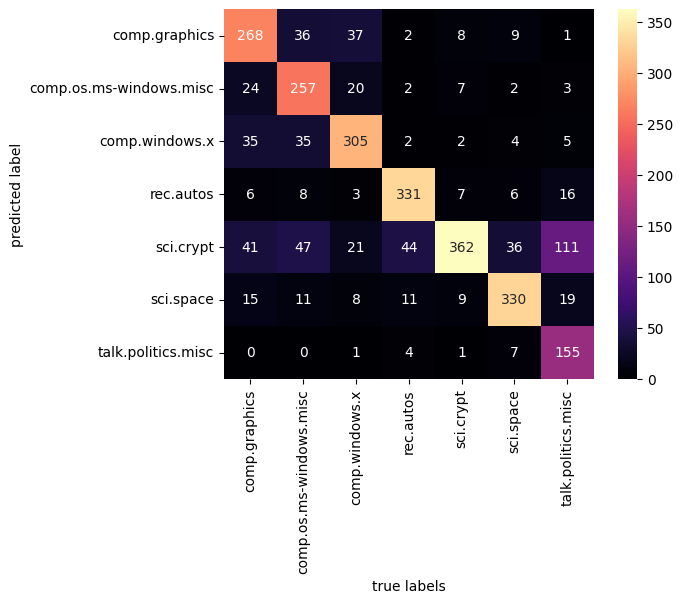

The accuracy is 0.7509349289454001


In [48]:
model = make_pipeline(TfidfVectorizer(), MultinomialNB())

model.fit(data_train['article'], data_train['label'])
predicted_categories = model.predict(data_test['article'])

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='magma', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Точность поднялась на 6%

# Проведём классификацию с помощью дерева решений:

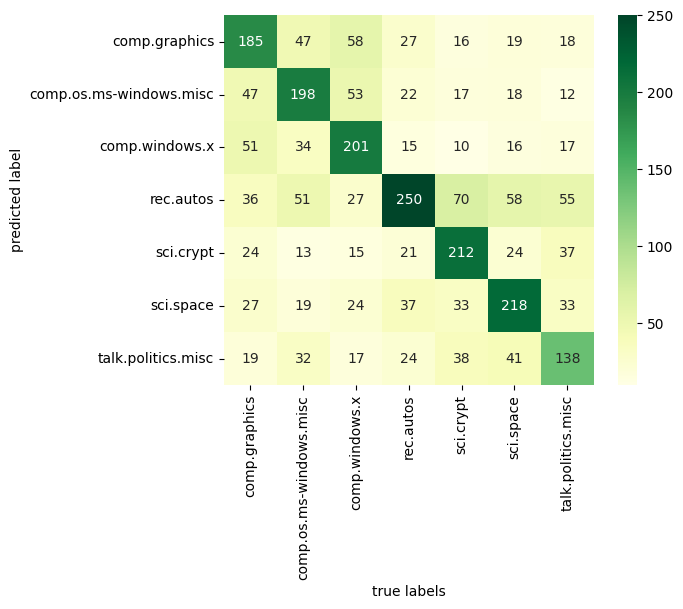

The accuracy is 0.5243081525804039


In [49]:
tree_model = make_pipeline(TfidfVectorizer(), DecisionTreeClassifier(criterion ='gini'))
tree_model.fit(group_train.data, group_train.target)
predicted_categories = tree_model.predict(group_test.data)

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='YlGn', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Проведём классификацию с помощью дерева решений для исправленного текста:

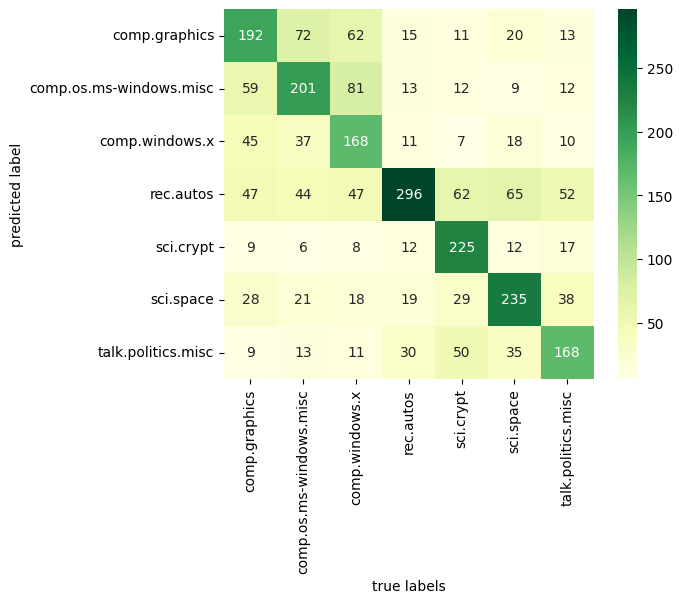

The accuracy is 0.5553477935676888


In [50]:
tree_model = make_pipeline(TfidfVectorizer(), DecisionTreeClassifier(criterion ='gini'))
tree_model.fit(data_train['article'], data_train['label'])
predicted_categories = tree_model.predict(data_test['article'])

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='YlGn', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Можно заметить, что точность поднялась лишь на 6 %, всё это связано с тем, что деревья решений работают плохо с большими и разряженными измерениями => плохо работают с текстовыми данными

# Случайный лес:

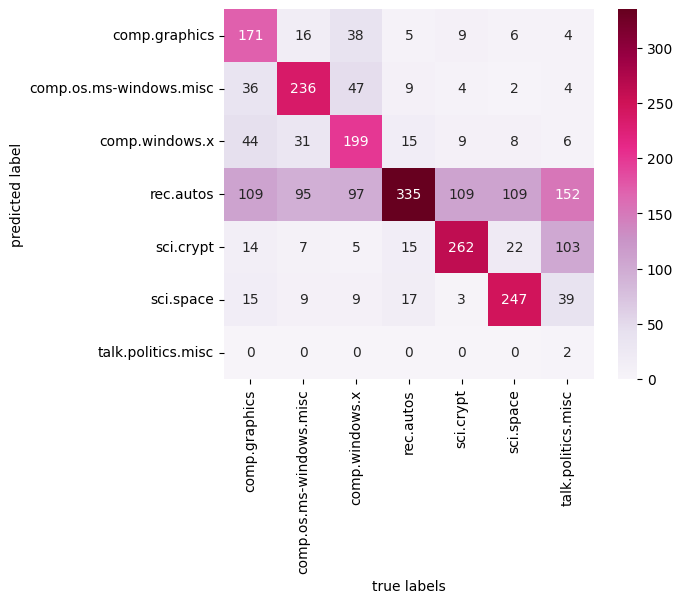

The accuracy is 0.5430067314884068


In [51]:
forest_model = make_pipeline(TfidfVectorizer(), RandomForestClassifier(criterion ='gini', max_depth = 2, random_state=0))
forest_model.fit(group_train.data, group_train.target)
predicted_categories = forest_model.predict(group_test.data)

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='PuRd', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# То же, но для модифицированного текста

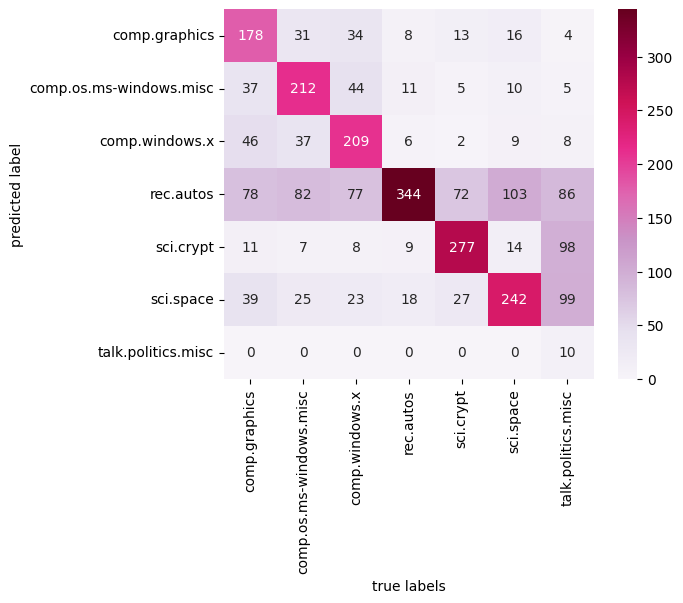

The accuracy is 0.550486163051608


In [52]:
forest_model = make_pipeline(TfidfVectorizer(), RandomForestClassifier(criterion ='gini', max_depth = 2, random_state=0))
forest_model.fit(data_train['article'], data_train['label'])
predicted_categories = forest_model.predict(data_test['article'])

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='PuRd', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Метод К-ближ. соседей для необработанных текстов

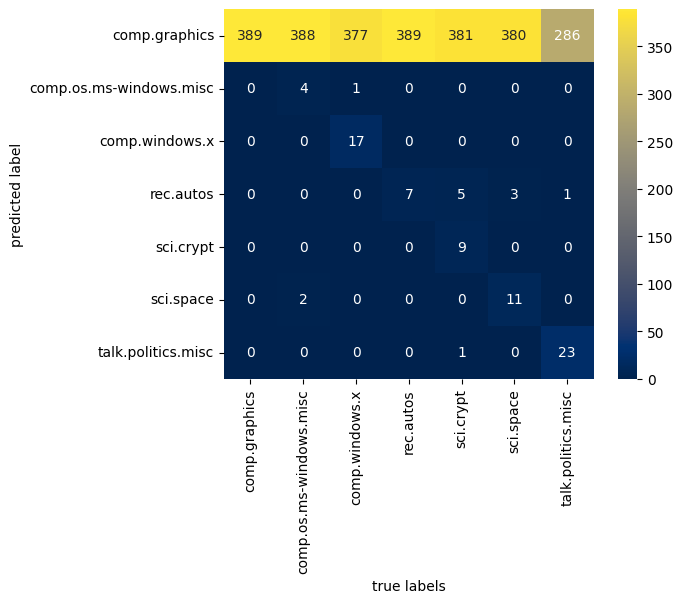

The accuracy is 0.17202692595362754


In [53]:
k_model = make_pipeline(TfidfVectorizer(), KNeighborsClassifier(n_neighbors=3))
k_model.fit(group_train.data, group_train.target)
predicted_categories = k_model.predict(group_test.data)

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='cividis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Метод К-ближ. соседей для обработанных текстов

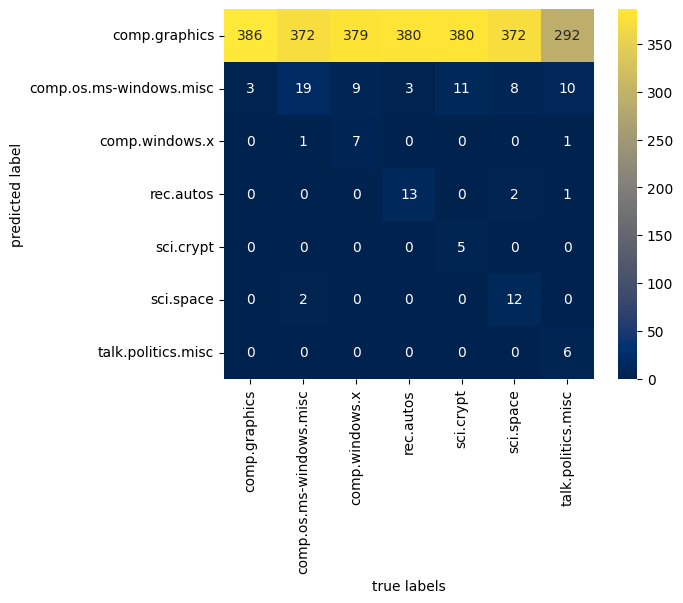

The accuracy is 0.16753926701570682


In [54]:
k_model = make_pipeline(TfidfVectorizer(), KNeighborsClassifier(n_neighbors=3))
k_model.fit(data_train['article'], data_train['label'])
predicted_categories = k_model.predict(data_test['article'])

mat = confusion_matrix(data_test['label'], predicted_categories)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='cividis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], predicted_categories)))

# Опять же, можно заметить, что точность поднялась всего лишь на 1%, при этом изначальная ну очень плохая => можно сказать что методы построения дерева решений и случайного леса очень плохо работают для текстовых данных, такие результаты классификатора нас совершенно не устраивают.

# =============================================================

# Word2Vec

# =============================================================

# Токенизируем тексты для обучения модели W2Vec

In [55]:
data_train['tokenize']=data_train['article'].apply(lambda x: list(word_tokenize(x)))
data_test['tokenize']=data_test['article'].apply(lambda x: list(word_tokenize(x)))

# Само обучение с сохранением полученной модели в файл

In [60]:
"""
w2vec_model = Word2Vec(min_count = 2, window = 2, sample=6e-5, alpha = 0.3, min_alpha = 0.0007)

t = time()
w2vec_model.build_vocab(data_train["tokenize"])
print('Time to build vocab: {} mins'.format(round((time() - t) / 60, 2)))

w2vec_model.train(data_train["tokenize"], total_examples=w2vec_model.corpus_count, epochs=10000, report_delay=1)
print('Time to train the model: {} mins'.format(round((time() - t) / 60, 2)))

w2vec_model.save("w2vec_model_file")"""

Time to build vocab: 0.0 mins
Time to train the model: 10.3 mins


# Использование ранее обученной модели из файла

In [61]:
w2vec_model = Word2Vec.load(r'w2vec_model_file')

# Преобразование наших текстов в вектора

In [62]:
def vectorize(list_of_docs, model):
    """Generate vectors for list of documents using a Word Embedding

    Args:
        list_of_docs: List of documents
        model: Gensim's Word Embedding

    Returns:
        List of document vectors
    """
    features = []

    for tokens in list_of_docs:
        zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            if token in model.wv:
                try:
                    vectors.append(model.wv[token])
                except KeyError:
                    continue
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features
    
vectorized_docs_train = vectorize(data_train['tokenize'], model = w2vec_model)
vectorized_docs_test = vectorize(data_test['tokenize'], model = w2vec_model)


# Проведение классификации с полученной моделью 
# 1) Логистическая регрессия

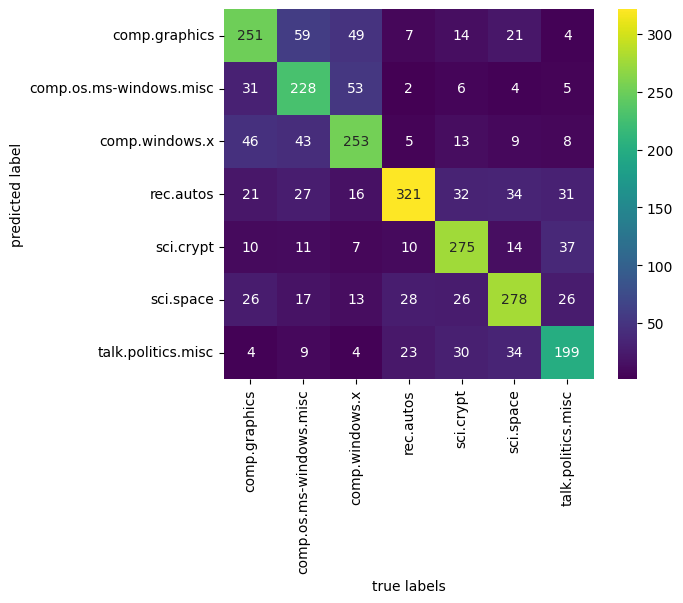

The accuracy is 0.675018698578908


In [63]:
clf = LogisticRegression( random_state=64, solver='lbfgs', max_iter=10000, n_jobs=-1)
clf.fit(vectorized_docs_train, data_train['label'])

w2vec_pred_LR = clf.predict(vectorized_docs_test)

mat = confusion_matrix(data_test['label'], w2vec_pred_LR)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='viridis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], w2vec_pred_LR)))

# Дерево решений

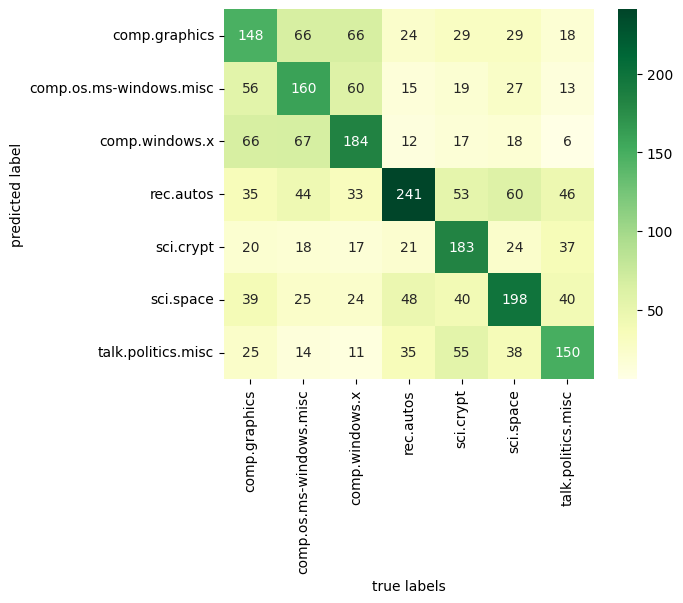

The accuracy is 0.47270007479431564


In [64]:
clf = DecisionTreeClassifier(criterion ='gini')
clf.fit(vectorized_docs_train, data_train['label'])

w2vec_pred_Tree = clf.predict(vectorized_docs_test)

mat = confusion_matrix(data_test['label'], w2vec_pred_Tree)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='YlGn', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], w2vec_pred_Tree)))

# Случайный лес

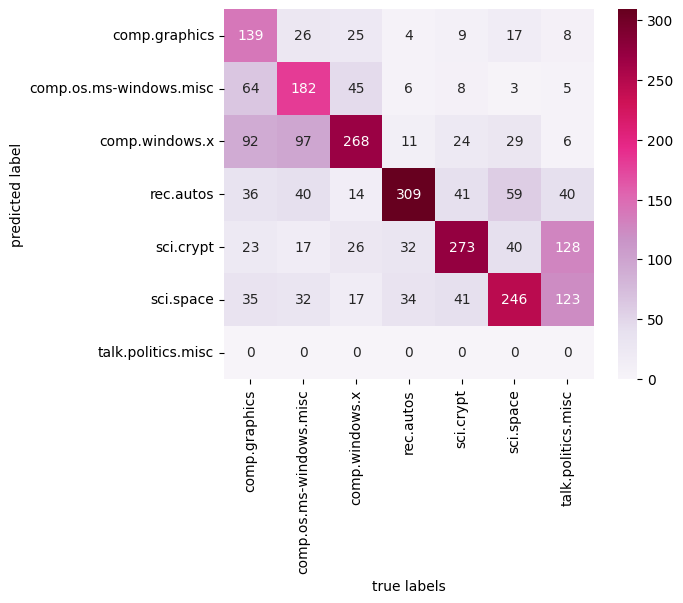

The accuracy is 0.5299177262528048


In [65]:
clf = RandomForestClassifier(criterion ='gini', max_depth = 2, random_state=0)
clf.fit(vectorized_docs_train, data_train['label'])

w2vec_pred_Forest = clf.predict(vectorized_docs_test)

mat = confusion_matrix(data_test['label'], w2vec_pred_Forest)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='PuRd', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], w2vec_pred_Forest)))

# К-ближайших соседей

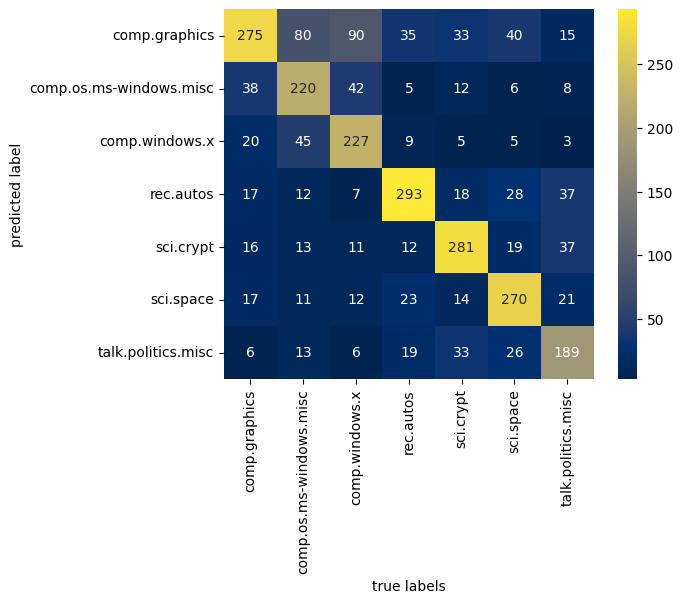

The accuracy is 0.656320119670905


In [66]:
clf = KNeighborsClassifier(n_neighbors=3)
clf.fit(vectorized_docs_train, data_train['label'])

w2vec_pred_KNeighbors = clf.predict(vectorized_docs_test)

mat = confusion_matrix(data_test['label'], w2vec_pred_KNeighbors)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='cividis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], w2vec_pred_KNeighbors)))

# Т.к. метод к-ближ. соседей дал очень хорошие результаты => можем попробовать провети TSNE для модели W2Vec
# 1) Train data

In [67]:
scaling.fit(vectorized_docs_train)
Scaled_train_data=scaling.transform(vectorized_docs_train)
principal.fit(Scaled_train_data)
x=principal.transform(Scaled_train_data)
print(x.shape, Scaled_train_data)

(4015, 3) [[-0.1326514  -0.32665173  1.44315644 ... -0.07699071 -0.47713174
  -1.40794815]
 [-1.23027775  0.03524946 -2.17590644 ... -0.34120487  0.79324897
   0.64271301]
 [ 0.72232443 -0.12696218  0.15180229 ...  0.75230491 -0.6304484
  -0.38419526]
 ...
 [-1.4659009   0.93395827  0.78852036 ...  1.72686491 -0.18733663
   1.41862366]
 [ 2.19457014  1.77002197 -0.86115784 ...  0.13678045 -0.64739219
   0.03192048]
 [ 0.63964593  0.53104997  0.4584379  ... -0.00799491 -0.68242006
  -0.35008197]]


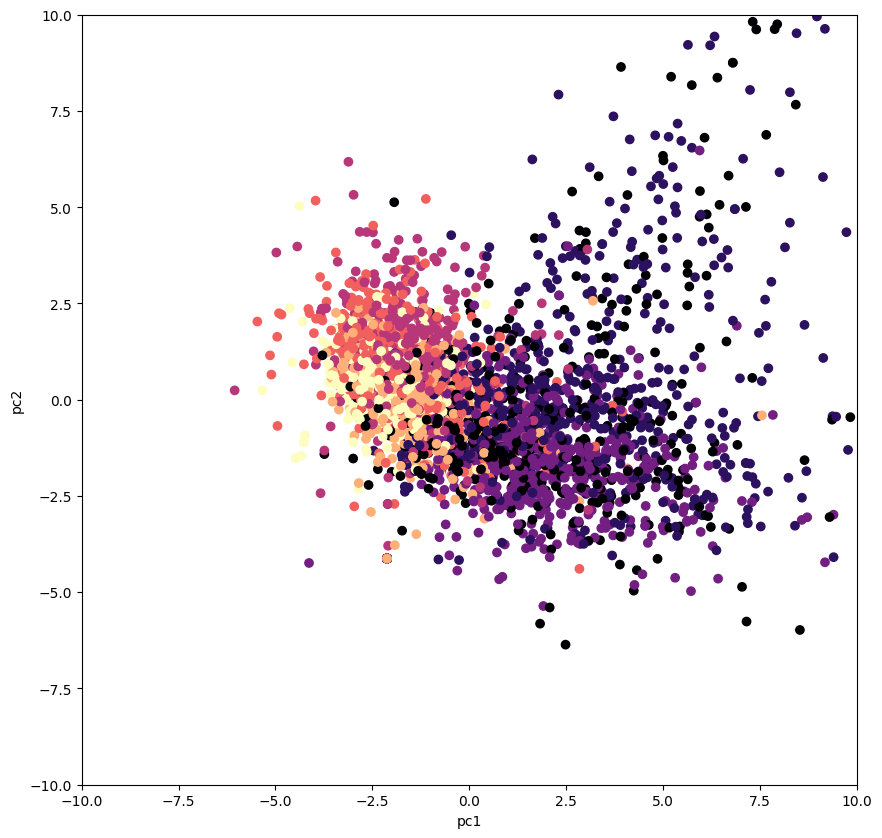

In [68]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_train['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

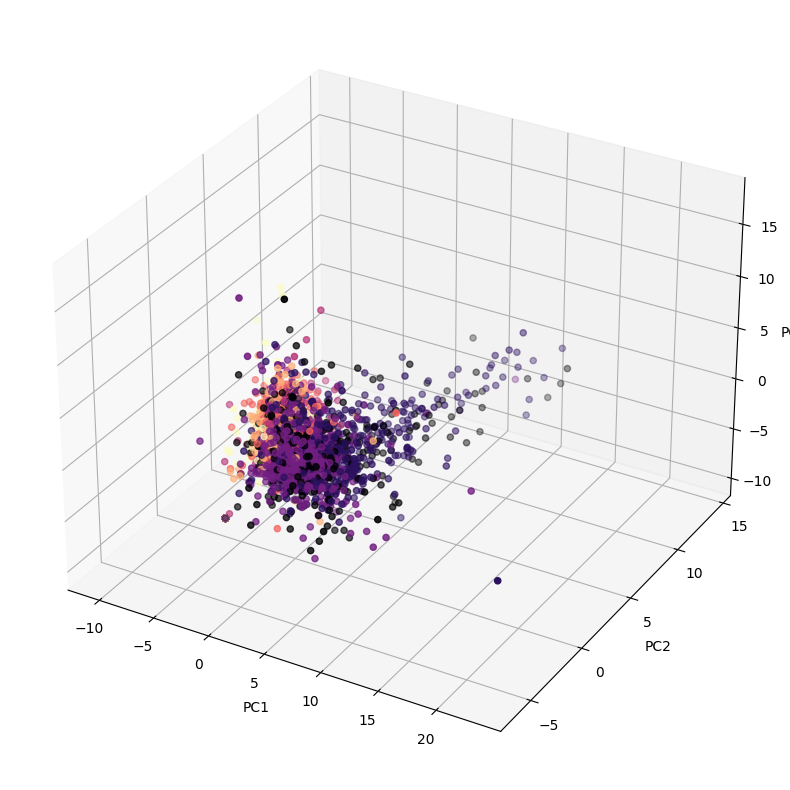

In [69]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_train['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# Test data

In [70]:
scaling.fit(vectorized_docs_test)
Scaled_test_data=scaling.transform(vectorized_docs_test)
principal.fit(Scaled_test_data)
x=principal.transform(Scaled_test_data)
print(x.shape, Scaled_test_data)

(2674, 3) [[-0.35381576  1.28971328  1.44370705 ...  1.47957546  0.045506
  -0.01884361]
 [-0.70177432 -0.27644261  0.20477031 ... -0.41607982 -1.06114384
   0.2541506 ]
 [ 0.44762851 -0.0605303   0.74936071 ...  0.59202648  2.58752392
  -0.80855455]
 ...
 [-0.36618046  0.18398156 -0.71684506 ... -0.30553246  0.05661568
  -0.53568573]
 [ 3.36312663 -1.32052333 -0.88892843 ...  0.68315831 -0.70313196
  -0.06997958]
 [-0.1763625  -0.710199    1.11602579 ... -1.59818892  0.29955509
  -0.90658816]]


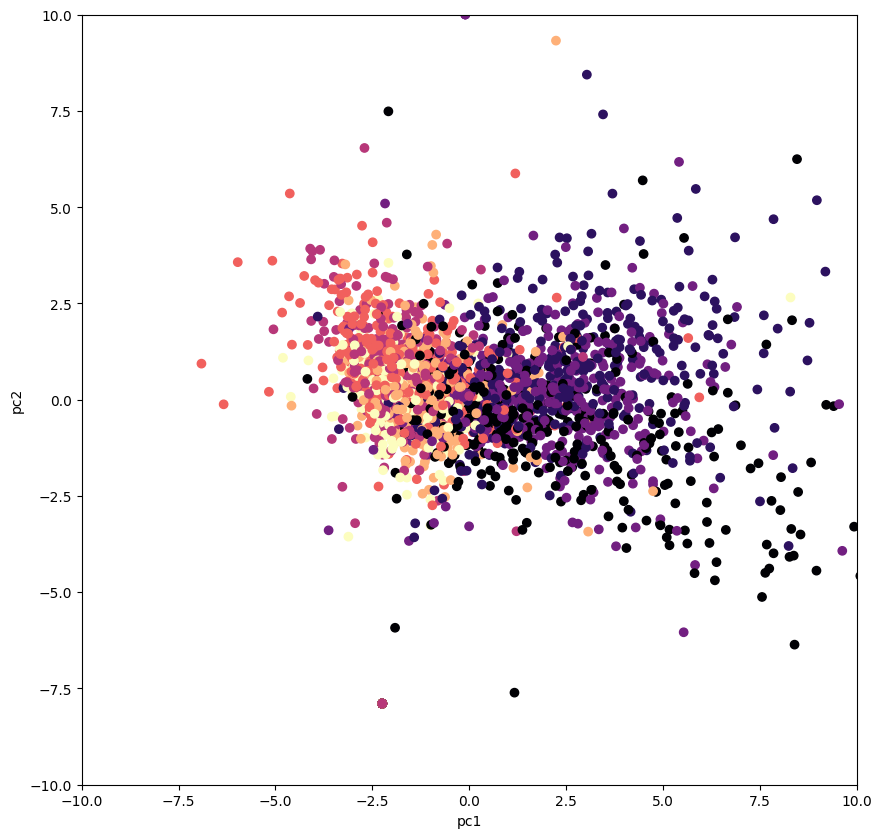

In [71]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_test['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

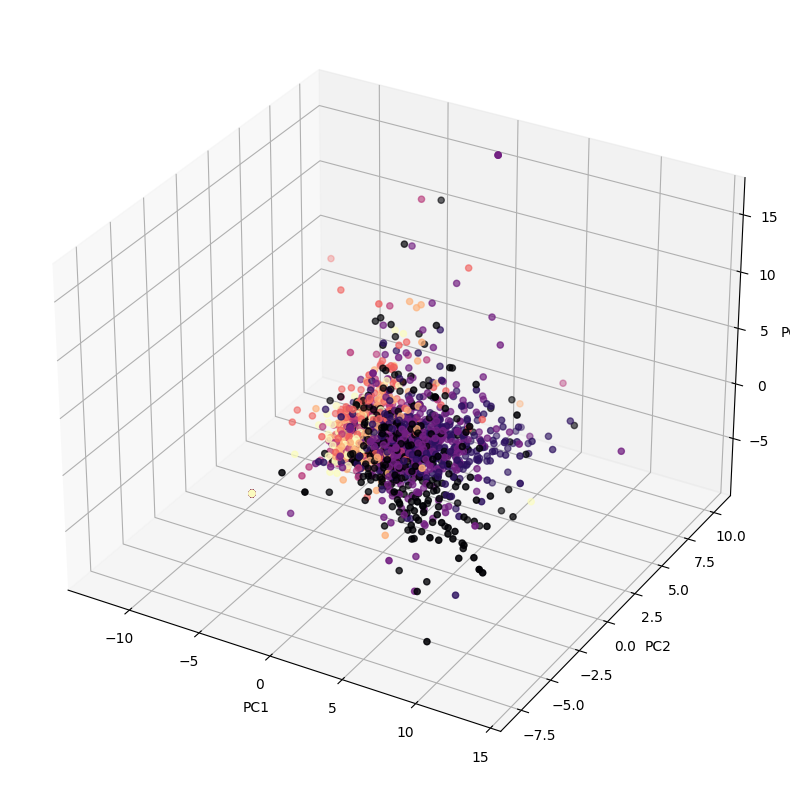

In [72]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_test['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# PCA выглядит странно можно попробовать построить TSNE
# 1) Train data

In [73]:
tsne = TSNE(n_components=3)
scaling.fit(vectorized_docs_train)
Scaled_train_data=scaling.transform(vectorized_docs_train)
tsne.fit(Scaled_train_data)
x=tsne.fit_transform(Scaled_train_data)
print(x.shape, Scaled_train_data)

(4015, 3) [[-0.1326514  -0.32665173  1.44315644 ... -0.07699071 -0.47713174
  -1.40794815]
 [-1.23027775  0.03524946 -2.17590644 ... -0.34120487  0.79324897
   0.64271301]
 [ 0.72232443 -0.12696218  0.15180229 ...  0.75230491 -0.6304484
  -0.38419526]
 ...
 [-1.4659009   0.93395827  0.78852036 ...  1.72686491 -0.18733663
   1.41862366]
 [ 2.19457014  1.77002197 -0.86115784 ...  0.13678045 -0.64739219
   0.03192048]
 [ 0.63964593  0.53104997  0.4584379  ... -0.00799491 -0.68242006
  -0.35008197]]


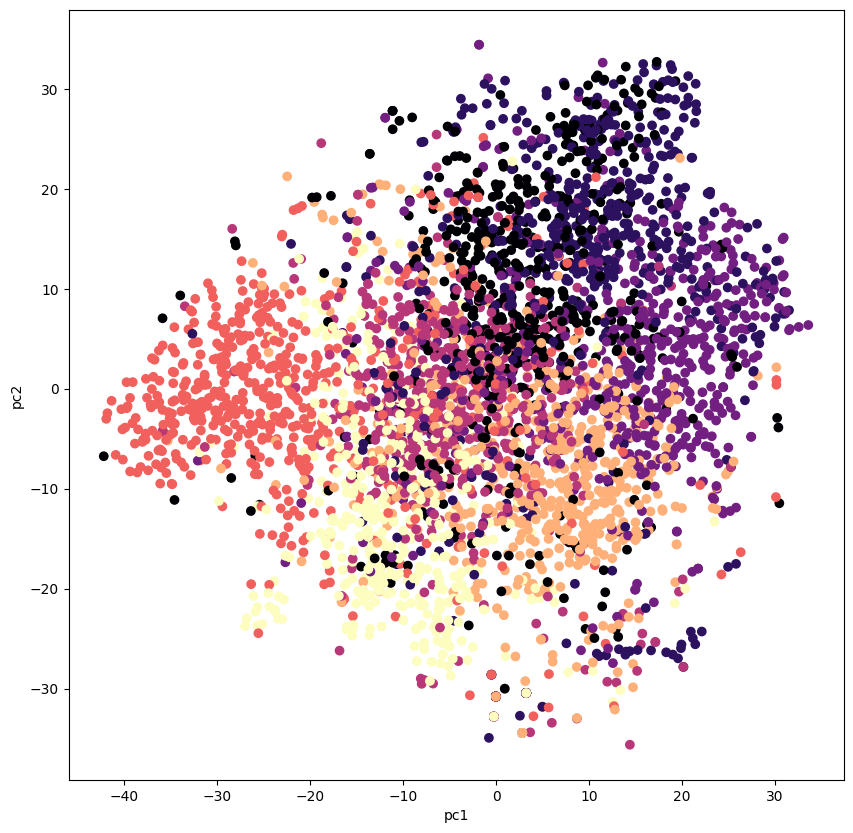

In [74]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_train['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
#plt.xlim([-10, 10])
#plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

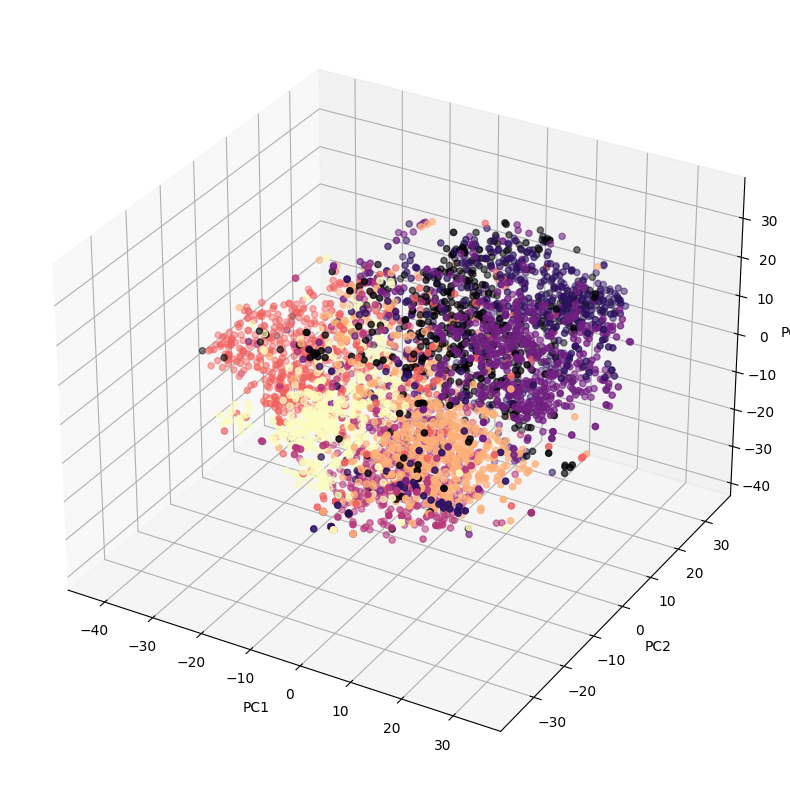

In [75]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_train['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# Test data

In [76]:
tsne = TSNE(n_components=3)
scaling.fit(vectorized_docs_test)
Scaled_test_data=scaling.transform(vectorized_docs_test)
tsne.fit(Scaled_test_data)
x=tsne.fit_transform(Scaled_test_data)
print(x.shape, Scaled_test_data)

(2674, 3) [[-0.35381576  1.28971328  1.44370705 ...  1.47957546  0.045506
  -0.01884361]
 [-0.70177432 -0.27644261  0.20477031 ... -0.41607982 -1.06114384
   0.2541506 ]
 [ 0.44762851 -0.0605303   0.74936071 ...  0.59202648  2.58752392
  -0.80855455]
 ...
 [-0.36618046  0.18398156 -0.71684506 ... -0.30553246  0.05661568
  -0.53568573]
 [ 3.36312663 -1.32052333 -0.88892843 ...  0.68315831 -0.70313196
  -0.06997958]
 [-0.1763625  -0.710199    1.11602579 ... -1.59818892  0.29955509
  -0.90658816]]


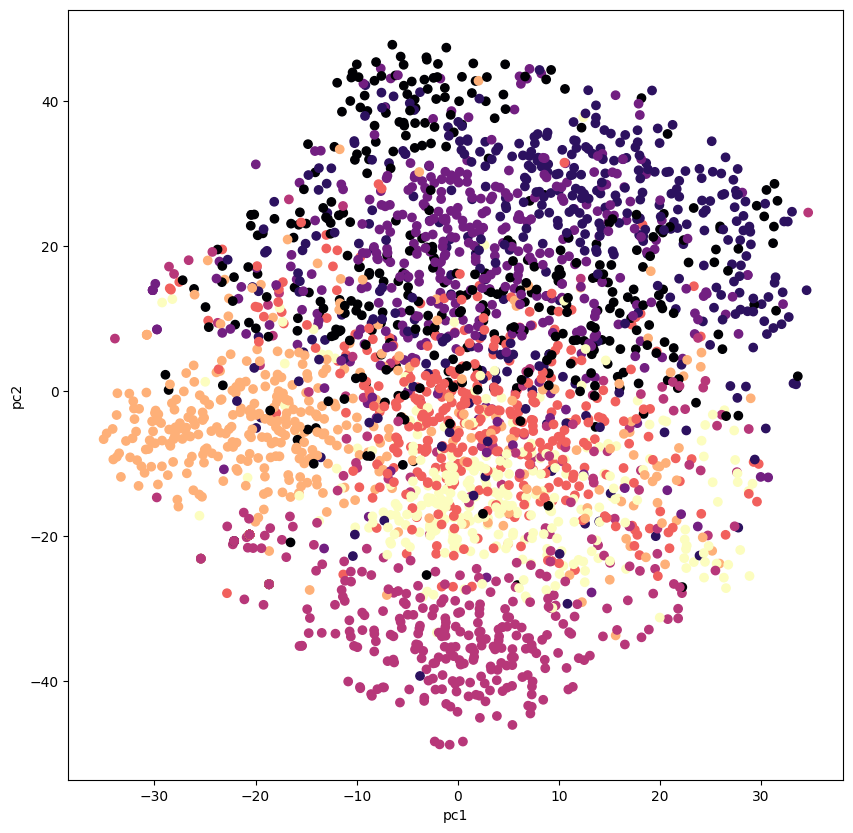

In [77]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_test['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
#plt.xlim([-10, 10])
#plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

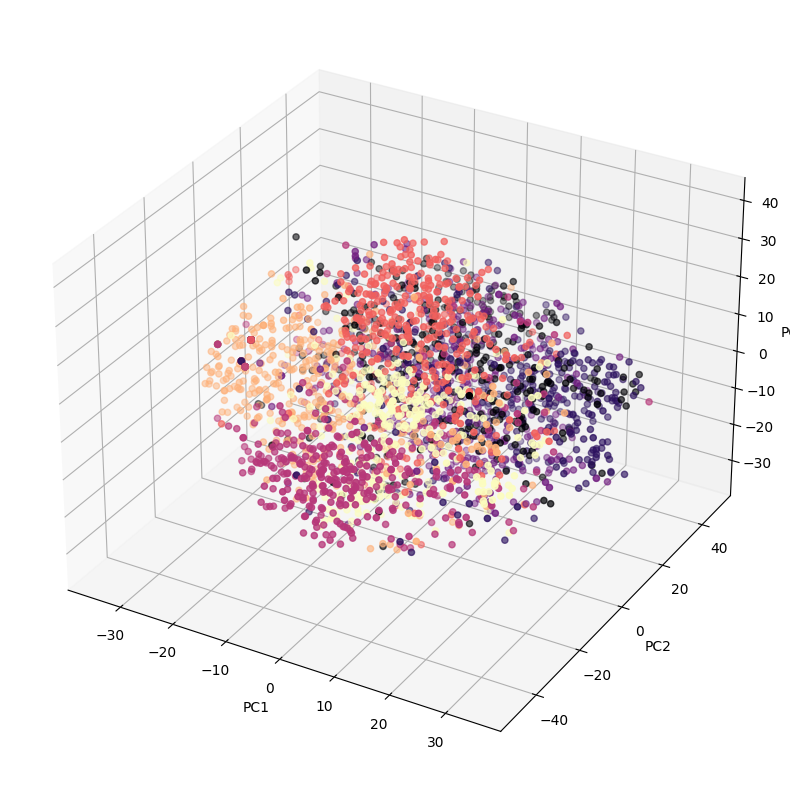

In [78]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_test['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# =============================================================

# Fast Text ыыыыыыыыыыыыыыыыыыы

# =============================================================

In [79]:
"""ft_model = FastText(data_train['tokenize'], vector_size = 200, window = 10, min_count = 1, sample = 1e-5,
                      sg=1, alpha = 0.3, min_alpha = 0.0001, workers = 8, negative = 2, epochs = 100)
t = time()
ft_model.build_vocab(data_train["tokenize"])
print('Time to build vocab: {} mins'.format(round((time() - t) / 60, 2)))

ft_model.train(data_train["tokenize"], total_examples=ft_model.corpus_count, epochs=500, report_delay=1)
print('Time to train the model: {} mins'.format(round((time() - t) / 60, 2)))

ft_model.save(r"ft_model_file")"""

Time to build vocab: 0.04 mins
Time to train the model: 4.6 mins


In [80]:
ft_model = FastText.load(r"ft_model_file")

In [81]:
def ft_vectorize(list_of_docs, model):
    """Generate vectors for list of documents using a Word Embedding

    Args:
        list_of_docs: List of documents
        model: Gensim's Word Embedding

    Returns:
        List of document vectors
    """
    features = []

    for tokens in list_of_docs:
        zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            if token in model.wv:
                try:
                    vectors.append(model.wv[token])
                except KeyError:
                    continue
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features
    
ft_vectorized_docs_train = ft_vectorize(data_train['tokenize'], model = ft_model)
ft_vectorized_docs_test = ft_vectorize(data_test['tokenize'], model = ft_model)


# Визуализируем полученные данные
# 1) Главные компоненты Train data

In [82]:
scaling.fit(ft_vectorized_docs_train)
Scaled_train_data=scaling.transform(ft_vectorized_docs_train)
principal.fit(Scaled_train_data)
x=principal.transform(Scaled_train_data)
print(x.shape, Scaled_train_data)

(4015, 3) [[-0.24131909  0.57526246  0.35243769 ...  0.64524376 -0.24692
  -0.87241905]
 [ 0.11693793  0.85784766  0.61375562 ... -0.11613911 -0.23678858
  -0.33720295]
 [-0.707463    0.24081875  0.05883389 ...  0.50724583 -1.08061557
   0.96203122]
 ...
 [ 1.09423073 -0.59423723 -1.13554948 ... -1.90057588  1.7827413
   0.75121968]
 [ 0.4713354   0.7767517   0.95993115 ... -0.21278995 -0.15504111
   0.1599902 ]
 [ 0.23692463  0.08259463  0.14944607 ... -0.21756164 -0.22994212
   0.92076824]]


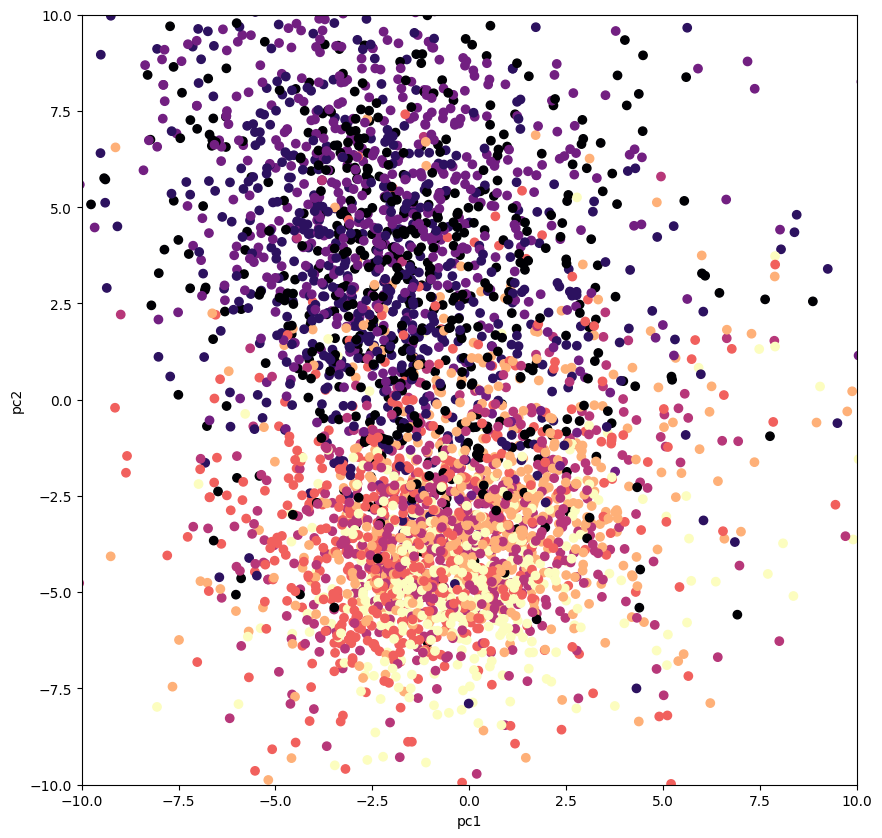

In [83]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_train['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

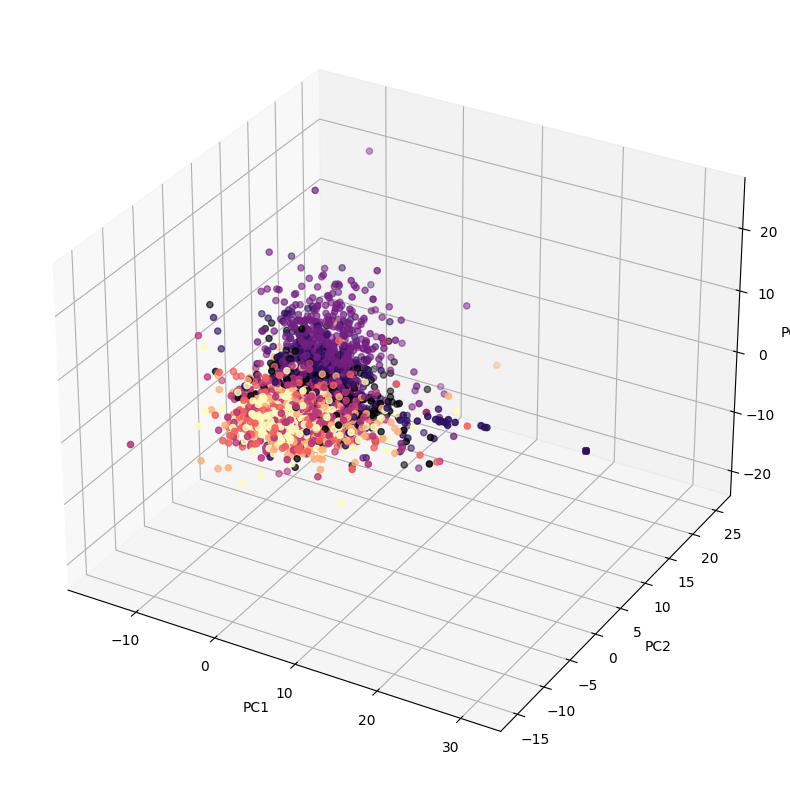

In [84]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_train['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# 2) Test data

In [85]:
scaling.fit(ft_vectorized_docs_test)
Scaled_test_data=scaling.transform(ft_vectorized_docs_test)
principal.fit(Scaled_test_data)
x=principal.transform(Scaled_test_data)
print(x.shape, Scaled_test_data)

(2674, 3) [[ 0.62986354 -0.72277113 -0.37524489 ...  0.29894108  0.71167316
   0.55984911]
 [-0.30268822  0.67759679  1.63776725 ...  0.89822023  0.75835854
   0.19273429]
 [ 1.10796167 -0.53998616  0.85771691 ... -0.268924    0.42769088
   0.90123675]
 ...
 [ 0.40581109 -0.16226163 -0.12584266 ... -0.6808501   0.41195562
   0.7316481 ]
 [-0.1514545   2.68281657  0.03794408 ...  0.6243795  -0.43506294
  -0.77756479]
 [-0.24218036  0.05380872 -0.22447481 ...  1.26371116  1.98673331
   0.05057884]]


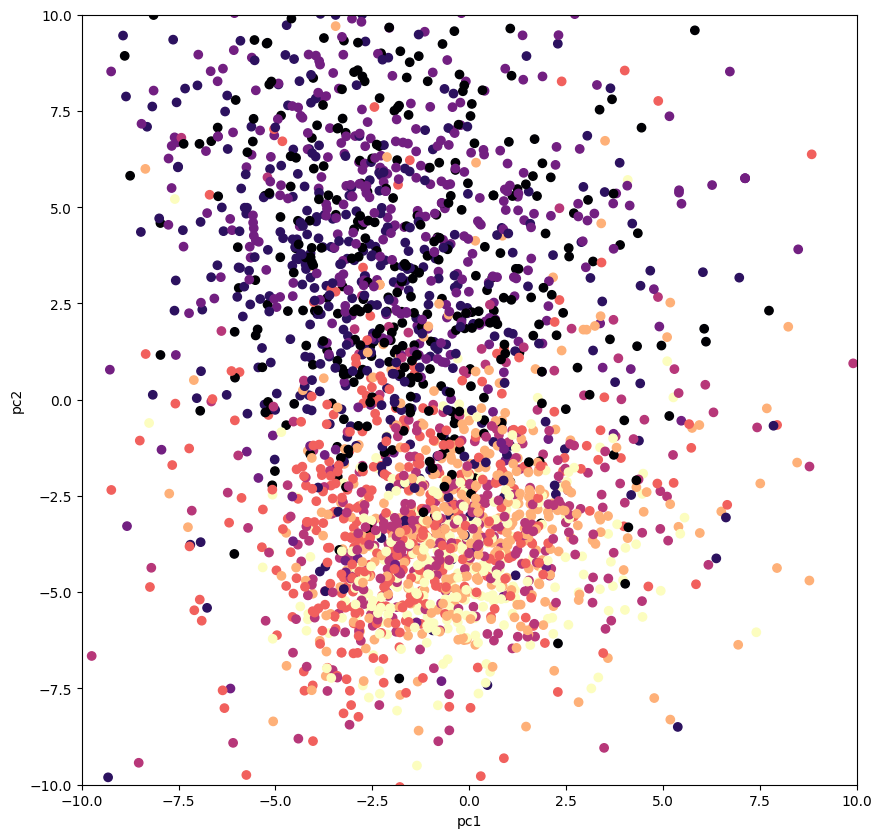

In [86]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_test['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

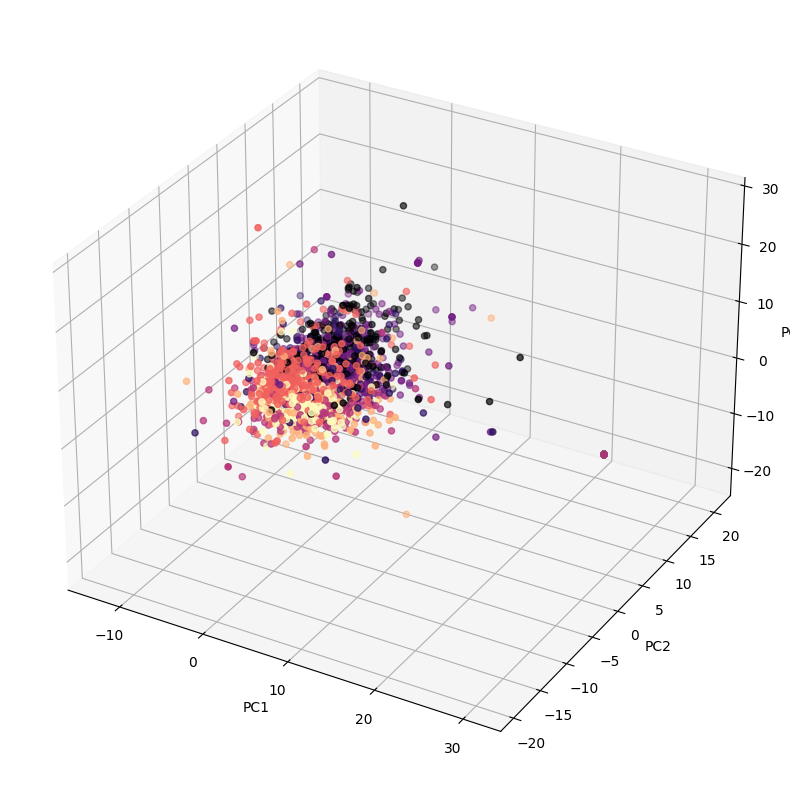

In [87]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_test['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# TSNE
# Train data

In [88]:
scaling.fit(ft_vectorized_docs_train)
Scaled_train_data=scaling.transform(ft_vectorized_docs_train)
tsne.fit(Scaled_train_data)
x=tsne.fit_transform(Scaled_train_data)
print(x.shape, Scaled_train_data)

(4015, 3) [[-0.24131909  0.57526246  0.35243769 ...  0.64524376 -0.24692
  -0.87241905]
 [ 0.11693793  0.85784766  0.61375562 ... -0.11613911 -0.23678858
  -0.33720295]
 [-0.707463    0.24081875  0.05883389 ...  0.50724583 -1.08061557
   0.96203122]
 ...
 [ 1.09423073 -0.59423723 -1.13554948 ... -1.90057588  1.7827413
   0.75121968]
 [ 0.4713354   0.7767517   0.95993115 ... -0.21278995 -0.15504111
   0.1599902 ]
 [ 0.23692463  0.08259463  0.14944607 ... -0.21756164 -0.22994212
   0.92076824]]


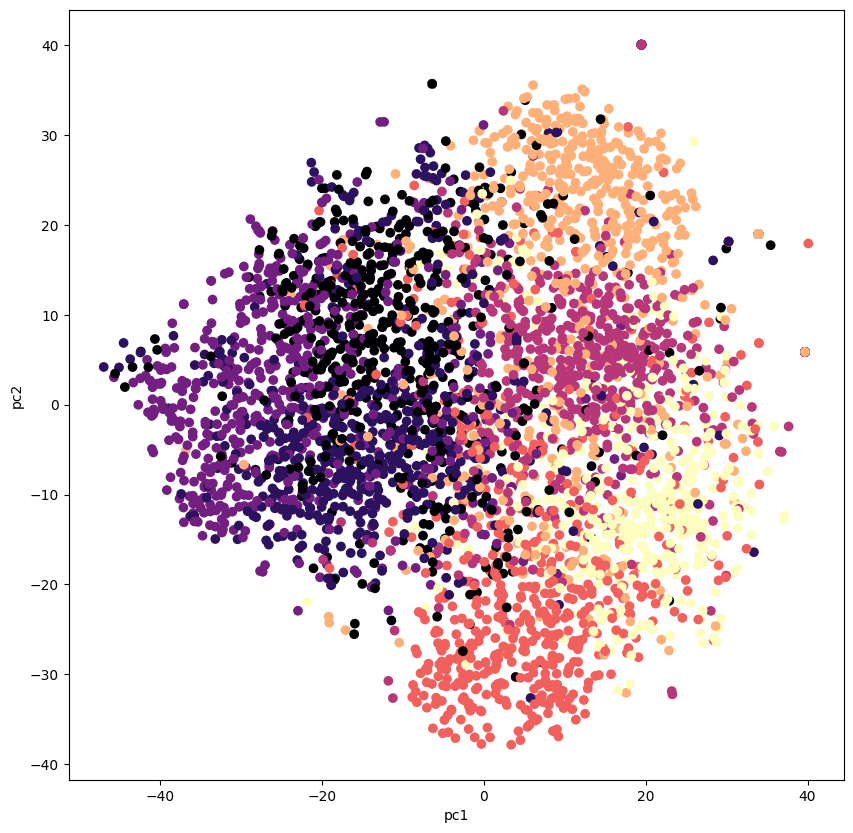

In [89]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_train['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
#plt.xlim([-10, 10])
#plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

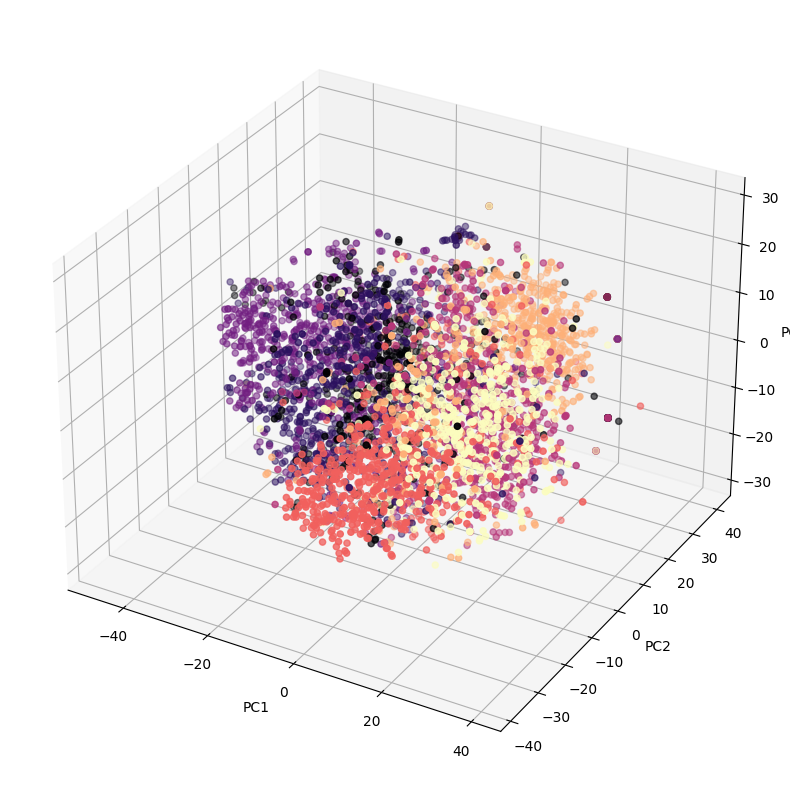

In [90]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_train['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# Test data

In [91]:
scaling.fit(ft_vectorized_docs_test)
Scaled_test_data=scaling.transform(ft_vectorized_docs_test)
tsne.fit(Scaled_test_data)
x=tsne.fit_transform(Scaled_test_data)
print(x.shape, Scaled_test_data)

(2674, 3) [[ 0.62986354 -0.72277113 -0.37524489 ...  0.29894108  0.71167316
   0.55984911]
 [-0.30268822  0.67759679  1.63776725 ...  0.89822023  0.75835854
   0.19273429]
 [ 1.10796167 -0.53998616  0.85771691 ... -0.268924    0.42769088
   0.90123675]
 ...
 [ 0.40581109 -0.16226163 -0.12584266 ... -0.6808501   0.41195562
   0.7316481 ]
 [-0.1514545   2.68281657  0.03794408 ...  0.6243795  -0.43506294
  -0.77756479]
 [-0.24218036  0.05380872 -0.22447481 ...  1.26371116  1.98673331
   0.05057884]]


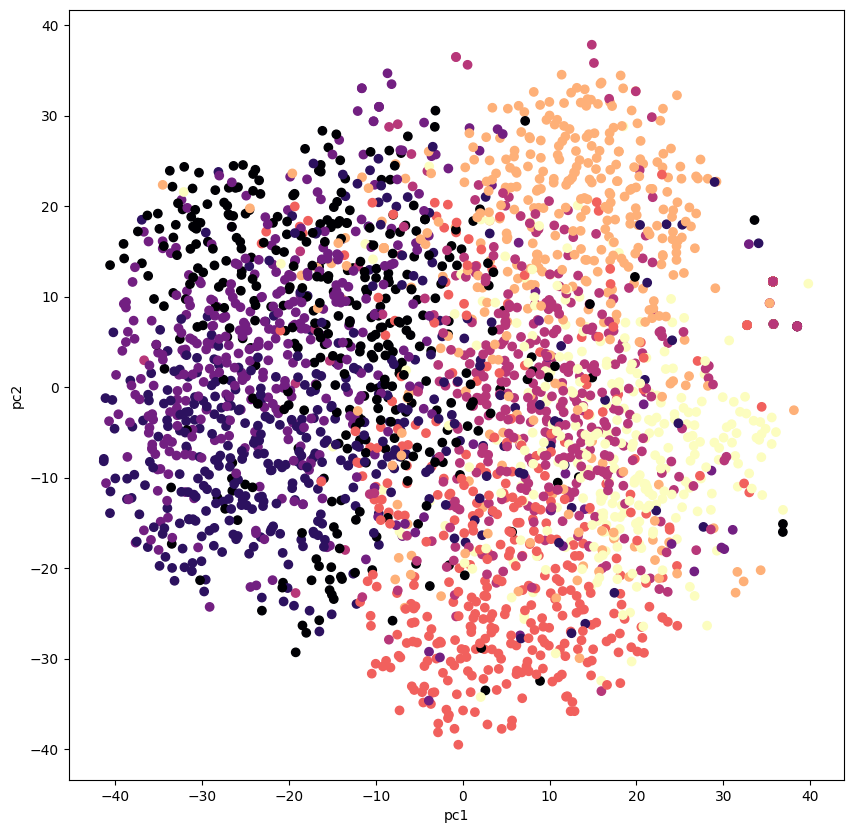

In [92]:
plt.figure(figsize=(10,10))
plt.scatter(x[:,0],x[:,1],c=data_test['label'],cmap='magma')
plt.xlabel('pc1')
plt.ylabel('pc2')
#plt.xlim([-10, 10])
#plt.ylim([-10, 10])
plt.show()

Text(0.5, 0, 'PC3')

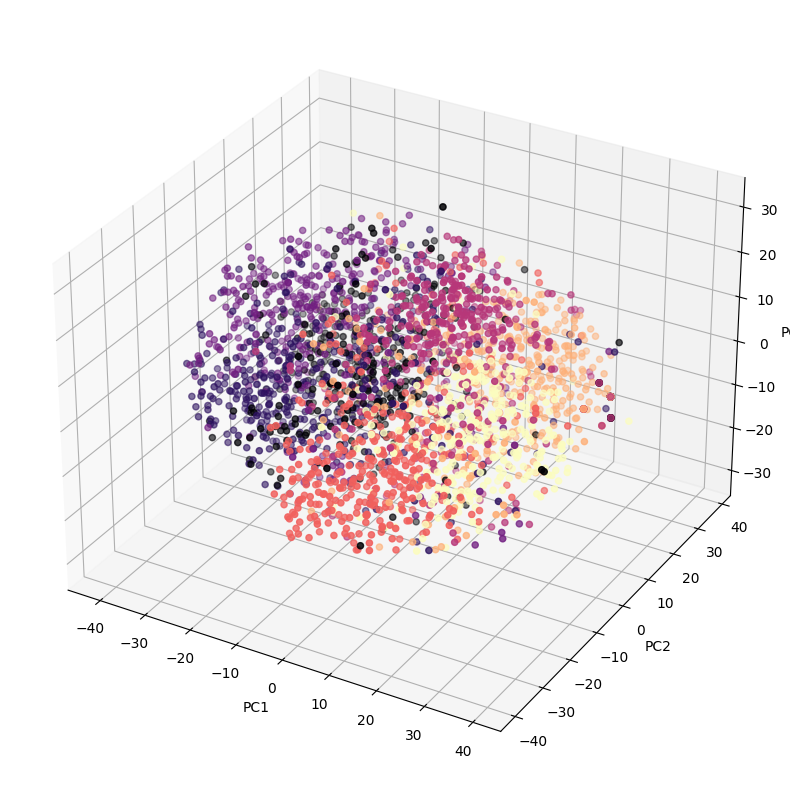

In [93]:
fig = plt.figure(figsize=(10,10))
 
# choose projection 3d for creating a 3d graph
axis = fig.add_subplot(111, projection='3d')
 
# x[:,0]is pc1,x[:,1] is pc2 while x[:,2] is pc3
axis.scatter(x[:,0],x[:,1],x[:,2], c=data_test['label'],cmap='magma')
axis.set_xlabel("PC1", fontsize=10)
axis.set_ylabel("PC2", fontsize=10)
axis.set_zlabel("PC3", fontsize=10)

# 

# Проведём классификацию по полученным векторам

#

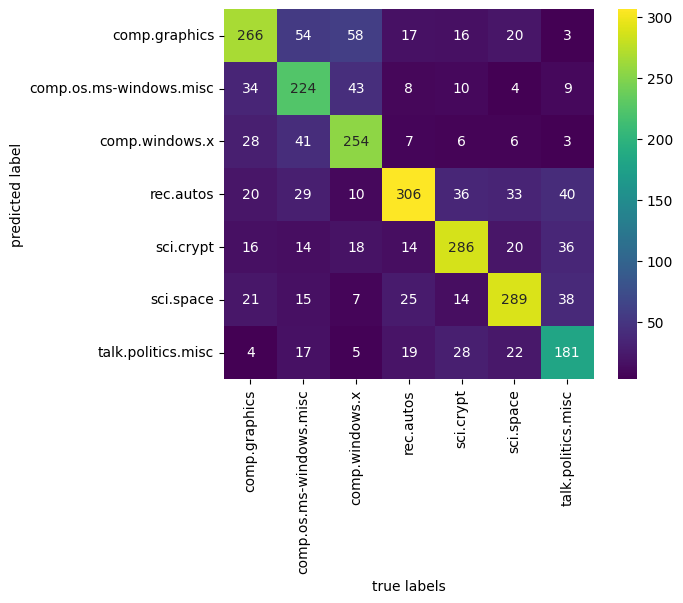

The accuracy is 0.675392670157068


In [94]:
clf = LogisticRegression( random_state=64, penalty='l2', solver='newton-cholesky', max_iter=10000, n_jobs=-1)
clf.fit(ft_vectorized_docs_train, data_train['label'])

ft_pred_LR = clf.predict(ft_vectorized_docs_test)

mat = confusion_matrix(data_test['label'], ft_pred_LR)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='viridis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], ft_pred_LR)))

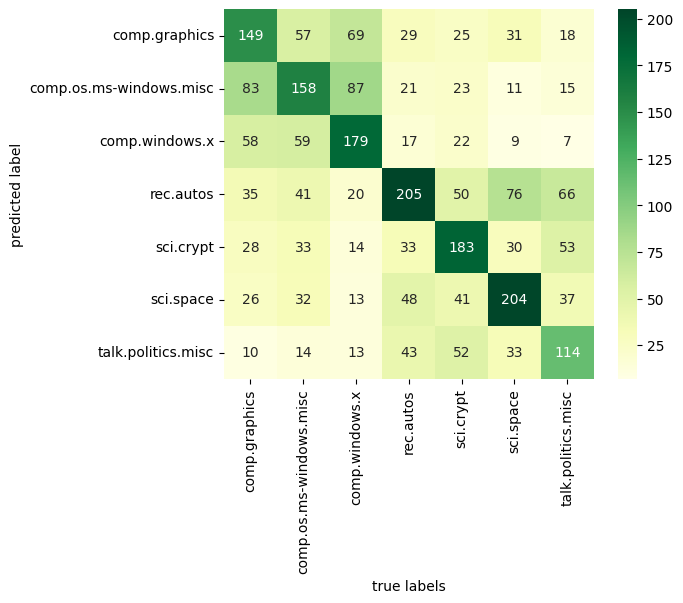

The accuracy is 0.4457741211667913


In [95]:
clf = DecisionTreeClassifier(criterion ='gini')
clf.fit(ft_vectorized_docs_train, data_train['label'])

ft_pred_Tree = clf.predict(ft_vectorized_docs_test)

mat = confusion_matrix(data_test['label'], ft_pred_Tree)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='YlGn', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], ft_pred_Tree)))

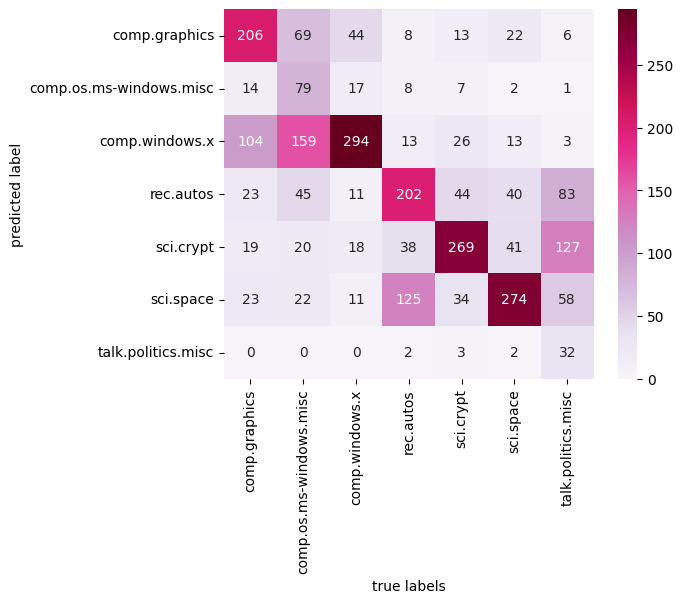

The accuracy is 0.5071054599850411


In [96]:
clf = RandomForestClassifier(criterion ='gini', max_depth = 2, random_state=0)
clf.fit(ft_vectorized_docs_train, data_train['label'])

ft_pred_Forest = clf.predict(ft_vectorized_docs_test)

mat = confusion_matrix(data_test['label'], ft_pred_Forest)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='PuRd', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], ft_pred_Forest)))

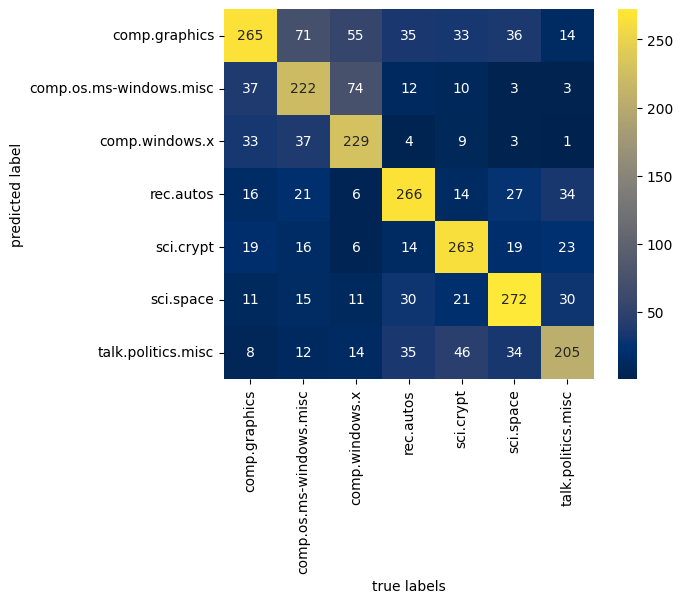

The accuracy is 0.643979057591623


In [97]:
clf = KNeighborsClassifier(n_neighbors=8)
clf.fit(ft_vectorized_docs_train, data_train['label'])

ft_pred_KNeighbors = clf.predict(ft_vectorized_docs_test)

mat = confusion_matrix(data_test['label'], ft_pred_KNeighbors)
sea.heatmap(mat.T, square = True, annot=True, fmt = "d", cmap='cividis', xticklabels=group_train.target_names,yticklabels=group_train.target_names)
plt.xlabel("true labels")
plt.ylabel("predicted label")
plt.show()
print("The accuracy is {}".format(accuracy_score(data_test['label'], ft_pred_KNeighbors)))

# Добавим чуть-чуть разнообразия, и засунем простой нейросетевой метод классификации текстов

In [98]:
tokenizer = Tokenizer(num_words=100000)
tokenizer.fit_on_texts(data_train['article'])
print(tokenizer.index_word)

{1: 'file', 2: 'program', 3: 'work', 4: 'people', 5: 'time', 6: 'window', 7: 'space', 8: 'problem', 9: 'include', 10: 'key', 11: 'image', 12: 'year', 13: 'data', 14: 'number', 15: 'good', 16: 'government', 17: 'set', 18: 'post', 19: 'car', 20: 'version', 21: 'bit', 22: 'support', 23: 'question', 24: 'email', 25: 'list', 26: 'point', 27: 'group', 28: 'write', 29: 'user', 30: 'chip', 31: 'application', 32: 'read', 33: 'server', 34: 'software', 35: 'encryption', 36: 'source', 37: 'send', 38: 'code', 39: 'call', 40: 'entry', 41: 'display', 42: 'president', 43: 'change', 44: 'start', 45: 'case', 46: 'mail', 47: 'package', 48: 'message', 49: 'widget', 50: 'law', 51: 'bhj', 52: 'public', 53: 'build', 54: 'run', 55: 'base', 56: 'ftp', 57: 'system', 58: 'format', 59: 'giz', 60: 'address', 61: 'color', 62: 'type', 63: 'output', 64: 'standard', 65: 'technology', 66: 'note', 67: 'issue', 68: 'launch', 69: 'lot', 70: 'graphic', 71: 'long', 72: 'driver', 73: 'sun', 74: 'high', 75: 'order', 76: 'clip

In [99]:
vocab_size = len(tokenizer.index_word) + 1
print('Vocab Size:', vocab_size)

Vocab Size: 55325


In [102]:
train_tokens = tokenizer.texts_to_sequences(data_train['article'])
test_tokens = tokenizer.texts_to_sequences(data_test['article'])

In [106]:
print("First Train Text:\n")
print(data_train['article'][0])
print("\nFirst Train Total Words:", len(str(data_train['article'][0]).split()))

First Train Text:

figure robert dubinski alias include robb regal sir marquette university math science doublemajor internet address adubinskivmscsdmuedu milwaukee

First Train Total Words: 17


In [107]:
print("First Instance Text Sequence:\n")
print(train_tokens[0])
print("\nFirst Instance Text Sequence Length:", len(train_tokens[0]))

First Instance Text Sequence:

[332, 835, 8126, 1674, 9, 8127, 5442, 3186, 6979, 142, 1536, 250, 8128, 103, 60, 8129, 4953]

First Instance Text Sequence Length: 17


In [108]:
seq_len = 350
train_tokens = pad_sequences(train_tokens, padding='post', maxlen=seq_len)
test_tokens = pad_sequences(test_tokens, padding='post', maxlen=seq_len)
print("First Instance Text Sequence:\n")
print(train_tokens[0])
print("\nFirst Instance Text Sequence Length:", len(train_tokens[0]))

First Instance Text Sequence:

[ 332  835 8126 1674    9 8127 5442 3186 6979  142 1536  250 8128  103
   60 8129 4953    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0 

In [317]:
embedding_dim = 100
model = Sequential()
model.add(layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=seq_len))

In [342]:
model.add(layers.Conv1D(filters=128, kernel_size=5, activation='relu'))
model.add(layers.GlobalMaxPool1D())

In [343]:
model.add(layers.Dense(64, activation='selu'))
model.add(layers.Dense(32, activation='selu'))
model.add(layers.Dense(14, activation='softmax'))

In [344]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_10 (Embedding)    (None, 350, 100)          5532500   
                                                                 
 conv1d_13 (Conv1D)          (None, 346, 128)          64128     
                                                                 
 global_max_pooling1d_26 (Gl  (None, 128)              0         
 obalMaxPooling1D)                                               
                                                                 
 dense_105 (Dense)           (None, 64)                8256      
                                                                 
 dense_106 (Dense)           (None, 32)                2080      
                                                                 
 dense_107 (Dense)           (None, 14)                462       
                                                     

In [345]:
history = model.fit(train_tokens, data_train['label'], epochs=10, validation_data=(test_tokens, data_test['label']), batch_size=128)

Epoch 1/10
32/32 [==============================] - 4s 112ms/step - loss: 2.0134 - accuracy: 0.3808 - val_loss: 1.5872 - val_accuracy: 0.6208
Epoch 2/10
32/32 [==============================] - 4s 113ms/step - loss: 0.9361 - accuracy: 0.8588 - val_loss: 0.8933 - val_accuracy: 0.7307
Epoch 3/10
32/32 [==============================] - 3s 110ms/step - loss: 0.2784 - accuracy: 0.9415 - val_loss: 0.7776 - val_accuracy: 0.7476
Epoch 4/10
32/32 [==============================] - 3s 108ms/step - loss: 0.1170 - accuracy: 0.9689 - val_loss: 0.7942 - val_accuracy: 0.7536
Epoch 5/10
32/32 [==============================] - 3s 109ms/step - loss: 0.0864 - accuracy: 0.9738 - val_loss: 0.8134 - val_accuracy: 0.7550
Epoch 6/10
32/32 [==============================] - 3s 108ms/step - loss: 0.0789 - accuracy: 0.9733 - val_loss: 0.8293 - val_accuracy: 0.7498
Epoch 7/10
32/32 [==============================] - 3s 107ms/step - loss: 0.0733 - accuracy: 0.9743 - val_loss: 0.8501 - val_accuracy: 0.7502
Epoch 

In [346]:
metrics_df = pd.DataFrame(history.history)
print(metrics_df)

       loss  accuracy  val_loss  val_accuracy
0  2.013410  0.380822  1.587237      0.620793
1  0.936089  0.858780  0.893335      0.730740
2  0.278359  0.941469  0.777564      0.747569
3  0.117028  0.968867  0.794246      0.753553
4  0.086396  0.973848  0.813397      0.755049
5  0.078901  0.973350  0.829300      0.749813
6  0.073291  0.974346  0.850065      0.750187
7  0.070170  0.975342  0.868399      0.753553
8  0.068264  0.974346  0.872244      0.753927
9  0.066121  0.975342  0.893187      0.752057


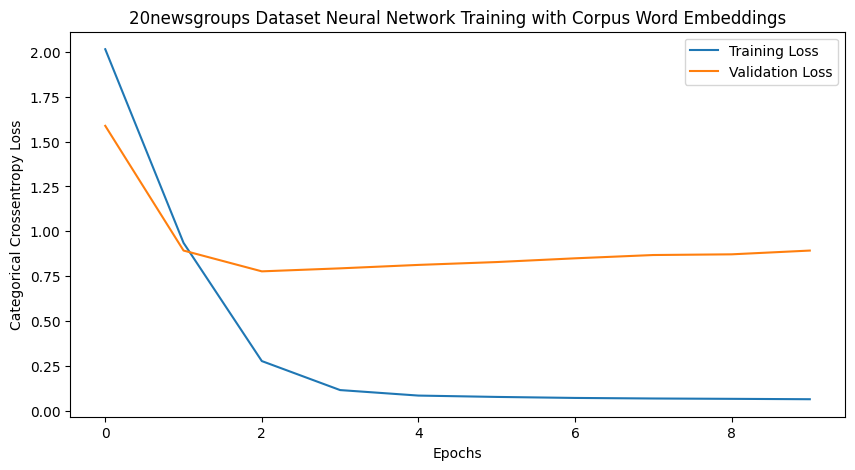

In [349]:
plt.figure(figsize=(10,5))
plt.plot(metrics_df.index, metrics_df.loss)
plt.plot(metrics_df.index, metrics_df.val_loss)
plt.title('20newsgroups Dataset Neural Network Training with Corpus Word Embeddings')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy Loss')
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()

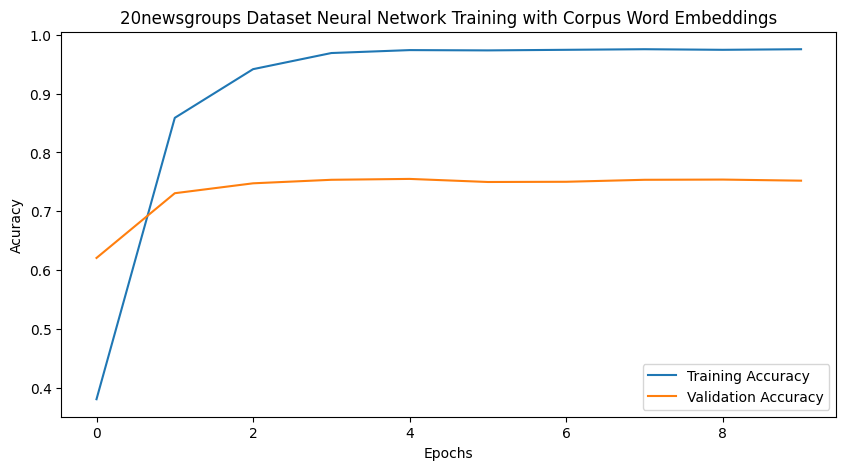

In [350]:
plt.figure(figsize=(10,5))
plt.plot(metrics_df.index, metrics_df.accuracy)
plt.plot(metrics_df.index, metrics_df.val_accuracy)
plt.title('20newsgroups Dataset Neural Network Training with Corpus Word Embeddings')
plt.xlabel('Epochs')
plt.ylabel('Acuracy')
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.show()

In [334]:
glove_embedding_filepath = r"D:\projects\PAD\glove.txt"
def create_embedding_matrix (filepath, word_index, embedding_dim):
    vocab_size = len(word_index) + 1
    embedding_matrix = np.zeros((vocab_size, embedding_dim))
     
    with open(filepath, encoding="utf8") as file:
        for line in file:
            word, *vector = line.split()
            if word in word_index:
                idx = word_index[word]
                embedding_matrix[idx] = np.array(vector, dtype=np.float32)[:embedding_dim]
     
    return embedding_matrix
 
embedding_dim = 100
embedding_matrix = create_embedding_matrix(glove_embedding_filepath, tokenizer.word_index, embedding_dim)

In [335]:
model_2 = Sequential()
model_2.add(layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=seq_len, weights = [embedding_matrix], trainable = True))
model_2.add(layers.Conv1D(filters=128, kernel_size=5, activation='relu'))
model_2.add(layers.GlobalMaxPool1D())
model_2.add(layers.Dense(64, activation='relu'))
model_2.add(layers.Dense(32, activation='relu'))
model_2.add(layers.Dense(20, activation='softmax'))
model_2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model_2.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 350, 100)          5532500   
                                                                 
 conv1d_12 (Conv1D)          (None, 346, 128)          64128     
                                                                 
 global_max_pooling1d_25 (Gl  (None, 128)              0         
 obalMaxPooling1D)                                               
                                                                 
 dense_102 (Dense)           (None, 64)                8256      
                                                                 
 dense_103 (Dense)           (None, 32)                2080      
                                                                 
 dense_104 (Dense)           (None, 20)                660       
                                                     

In [336]:
history_2 = model_2.fit(train_tokens, data_train['label'], epochs=10, validation_data=(test_tokens, data_test['label']), batch_size=128)

Epoch 1/10
32/32 [==============================] - 4s 116ms/step - loss: 2.2689 - accuracy: 0.2336 - val_loss: 1.6403 - val_accuracy: 0.4720
Epoch 2/10
32/32 [==============================] - 3s 109ms/step - loss: 1.2808 - accuracy: 0.5998 - val_loss: 1.1412 - val_accuracy: 0.5845
Epoch 3/10
32/32 [==============================] - 4s 112ms/step - loss: 0.8422 - accuracy: 0.7138 - val_loss: 0.9980 - val_accuracy: 0.6432
Epoch 4/10
32/32 [==============================] - 3s 108ms/step - loss: 0.6084 - accuracy: 0.8164 - val_loss: 0.9435 - val_accuracy: 0.6664
Epoch 5/10
32/32 [==============================] - 3s 109ms/step - loss: 0.4253 - accuracy: 0.8902 - val_loss: 0.8952 - val_accuracy: 0.6930
Epoch 6/10
32/32 [==============================] - 3s 108ms/step - loss: 0.2945 - accuracy: 0.9315 - val_loss: 0.9124 - val_accuracy: 0.6862
Epoch 7/10
32/32 [==============================] - 4s 110ms/step - loss: 0.2055 - accuracy: 0.9542 - val_loss: 0.9116 - val_accuracy: 0.6990
Epoch 

In [338]:
metrics_2_df = pd.DataFrame(history_2.history)
print(metrics_df)

       loss  accuracy  val_loss  val_accuracy
0  2.309012  0.143960  2.008270      0.264772
1  1.888516  0.432877  1.849003      0.362378
2  1.636512  0.647073  1.541894      0.567689
3  1.074646  0.836115  1.095196      0.720269
4  0.557145  0.932005  0.869555      0.733358
5  0.294755  0.953923  0.783132      0.746073
6  0.179218  0.964882  0.756378      0.750561
7  0.128435  0.971108  0.745412      0.759910
8  0.102314  0.973599  0.744366      0.754675
9  0.088435  0.975342  0.742600      0.754301


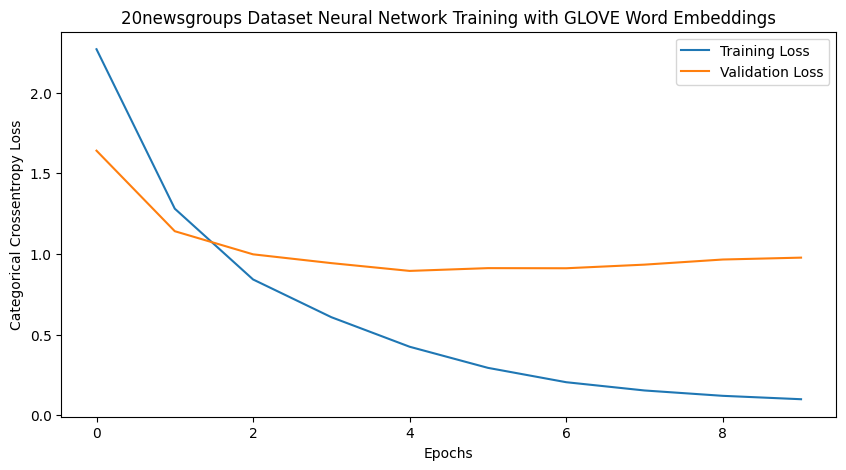

In [351]:
plt.figure(figsize=(10,5))
plt.plot(metrics_2_df.index, metrics_2_df.loss)
plt.plot(metrics_2_df.index, metrics_2_df.val_loss)
plt.title('20newsgroups Dataset Neural Network Training with GLOVE Word Embeddings')
plt.xlabel('Epochs')
plt.ylabel('Categorical Crossentropy Loss')
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()

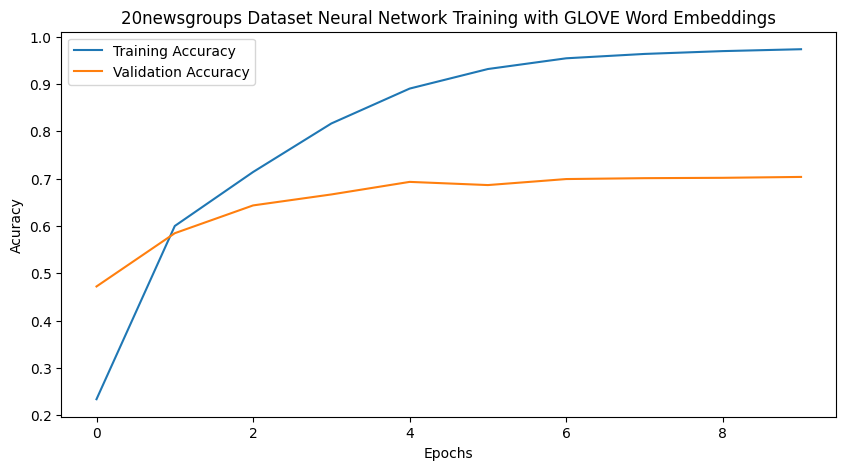

In [352]:
plt.figure(figsize=(10,5))
plt.plot(metrics_2_df.index, metrics_2_df.accuracy)
plt.plot(metrics_2_df.index, metrics_2_df.val_accuracy)
plt.title('20newsgroups Dataset Neural Network Training with GLOVE Word Embeddings')
plt.xlabel('Epochs')
plt.ylabel('Acuracy')
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.show()